In [3]:
!pip install arabic-reshaper

In [5]:
!pip install python-bidi


In [84]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from collections import defaultdict
from itertools import combinations
from time import time
import random
import arabic_reshaper
from bidi.algorithm import get_display
from matplotlib.patches import Patch
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import io

In [86]:
# Function to fix Arabic text for display
def fix_arabic(text):
    return get_display(arabic_reshaper.reshape(str(text)))


In [88]:
# Function to perform greedy coloring with a specified strategy
def greedy_coloring(graph, strategy):
    return nx.coloring.greedy_color(graph, strategy=strategy)


In [90]:
excel_file="C:/Users/KimoStore/Downloads/studentcourses.xlsx"
sheets = pd.read_excel(excel_file, sheet_name=None)

In [91]:
    MAX_STUDENTS_PER_DAY = 200
    final_output = []
    comparison_data = []
    skipped_sheets = []
    processed_sheets = []


In [94]:
    for sheet_name, df in sheets.items():
        if df.empty:
            skipped_sheets.append(sheet_name)
            print(f"⚠ Sheet {sheet_name} is empty. Skipping.")
            continue  # Skip empty sheets


In [96]:
        df = df.rename(columns={df.columns[1]: 'Student ID',
                                df.columns[2]: 'Student Name',
                                df.columns[3]: 'Course Name (EN)',
                                df.columns[4]: 'Course Name (AR)',
                                df.columns[6]: 'Course Code'})
        df = df[['Student ID', 'Course Code', 'Course Name (EN)', 'Course Name (AR)']].dropna()


In [98]:
        course_students = defaultdict(set)
        course_names_ar = {}
        for _, row in df.iterrows():
            course_code = row['Course Code']
            student_id = row['Student ID']
            course_name_ar = row['Course Name (AR)']
            course_students[course_code].add(student_id)
            course_names_ar[course_code] = course_name_ar


In [100]:
        # Creating graph based on course students
        G = nx.Graph()
        G.add_nodes_from(course_students.keys())
        for c1, c2 in combinations(course_students.keys(), 2):
            if course_students[c1] & course_students[c2]:
                G.add_edge(c1, c2)
            try:
                code1, code2 = int(str(c1)), int(str(c2))
                if abs(code1 - code2) <= 1:
                    G.add_edge(c1, c2)
            except ValueError:
                pass

        # If no edges, add random edges for visualization
        if len(G.edges()) == 0:
            print(f"No edges found for sheet {sheet_name}. Adding random edges for visualization.")
            courses = list(G.nodes())
            for _ in range(min(3, len(courses) - 1)):
                c1, c2 = random.sample(courses, 2)
                G.add_edge(c1, c2)


C:\Users\KimoStore\AppData\Local\Temp\ipykernel_8560\2885526118.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', num_colors)
C:\Users\KimoStore\AppData\Local\Temp\ipykernel_8560\2885526118.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


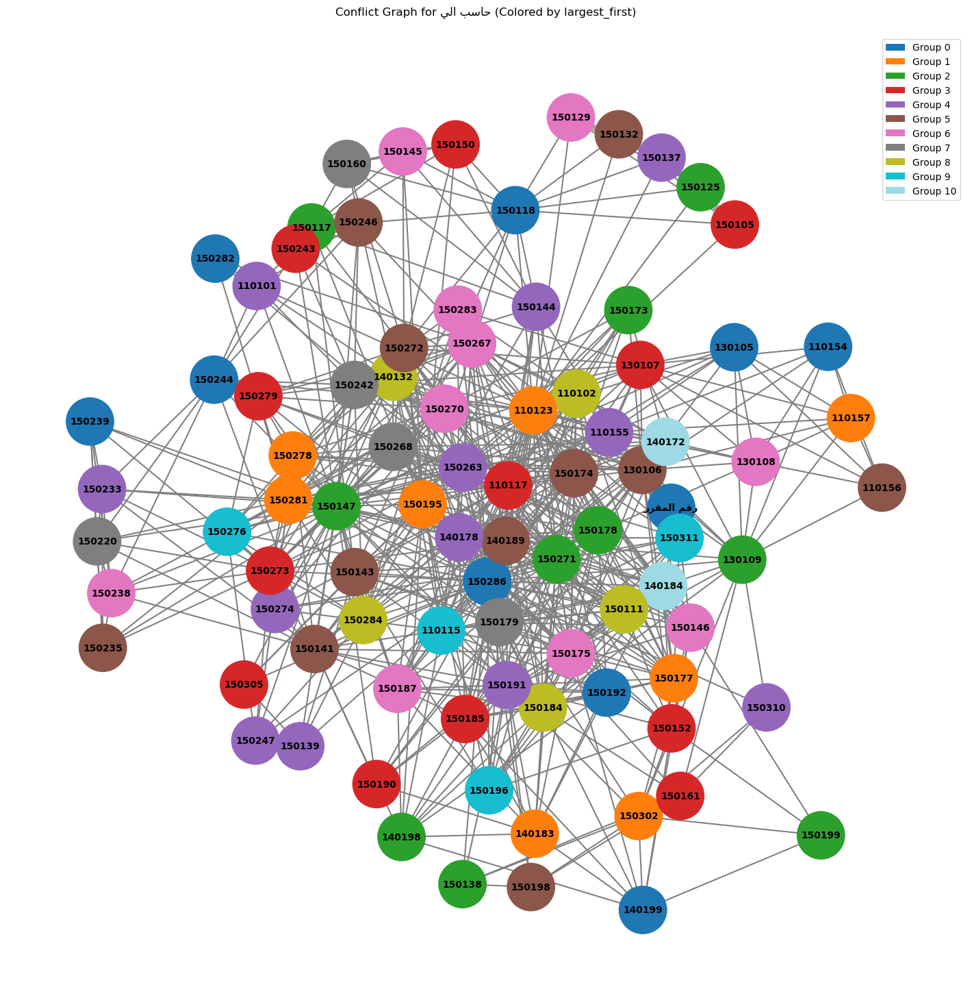

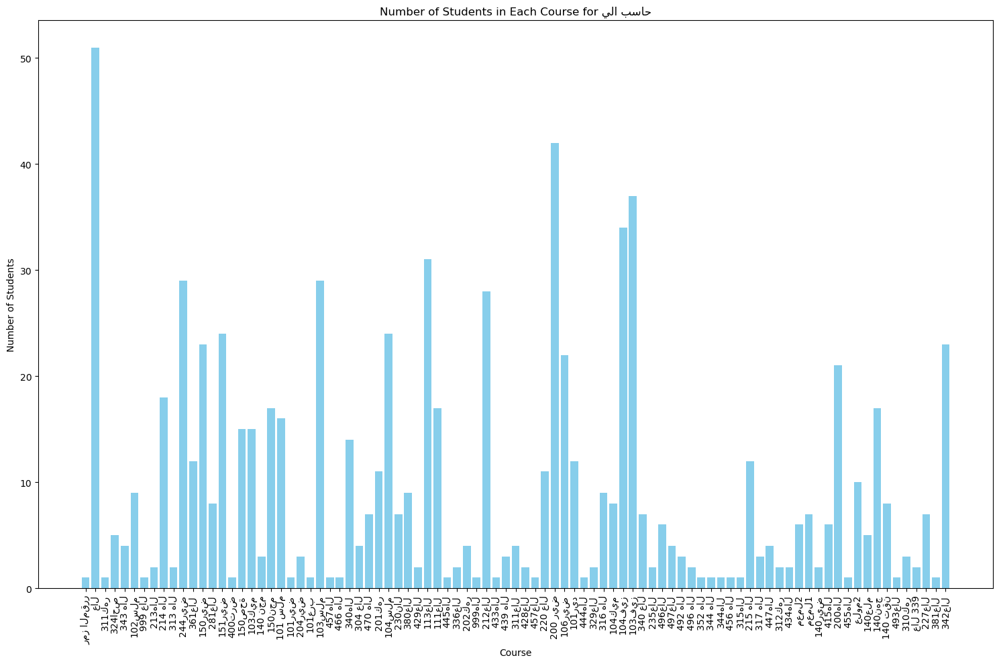

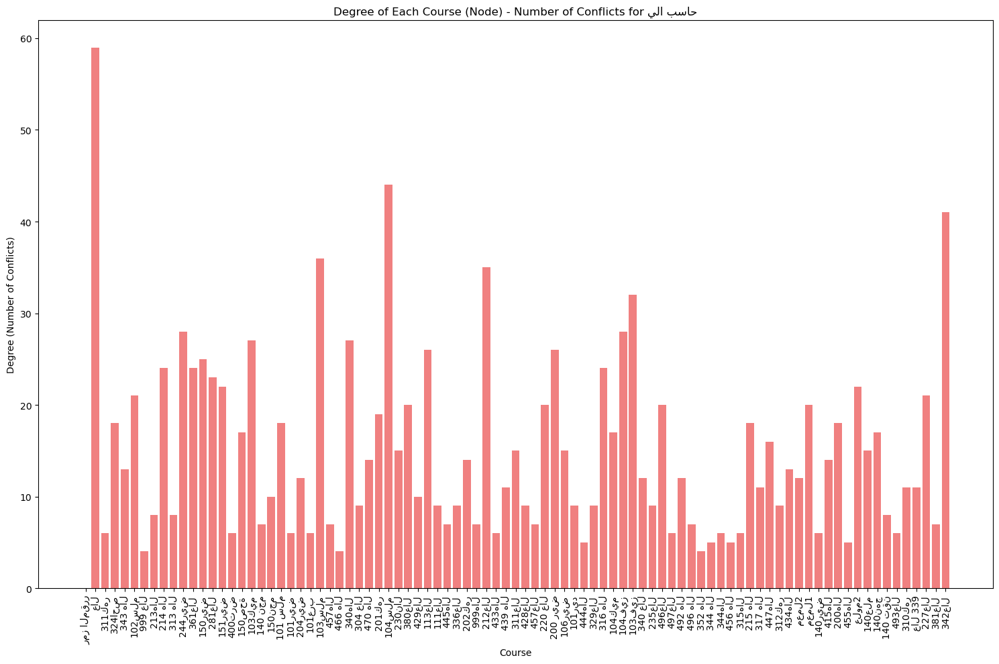

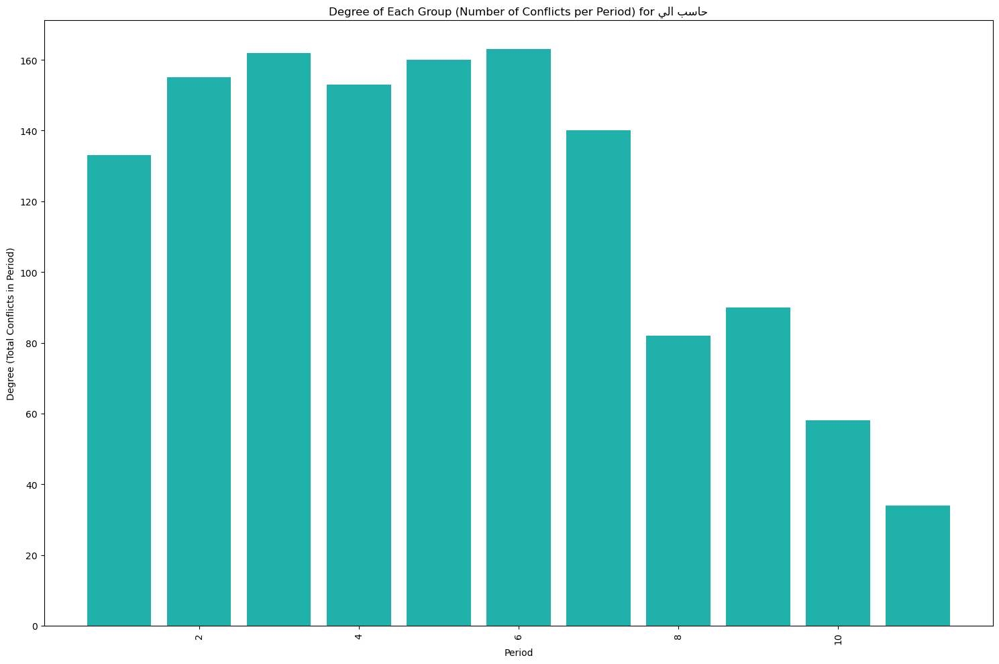

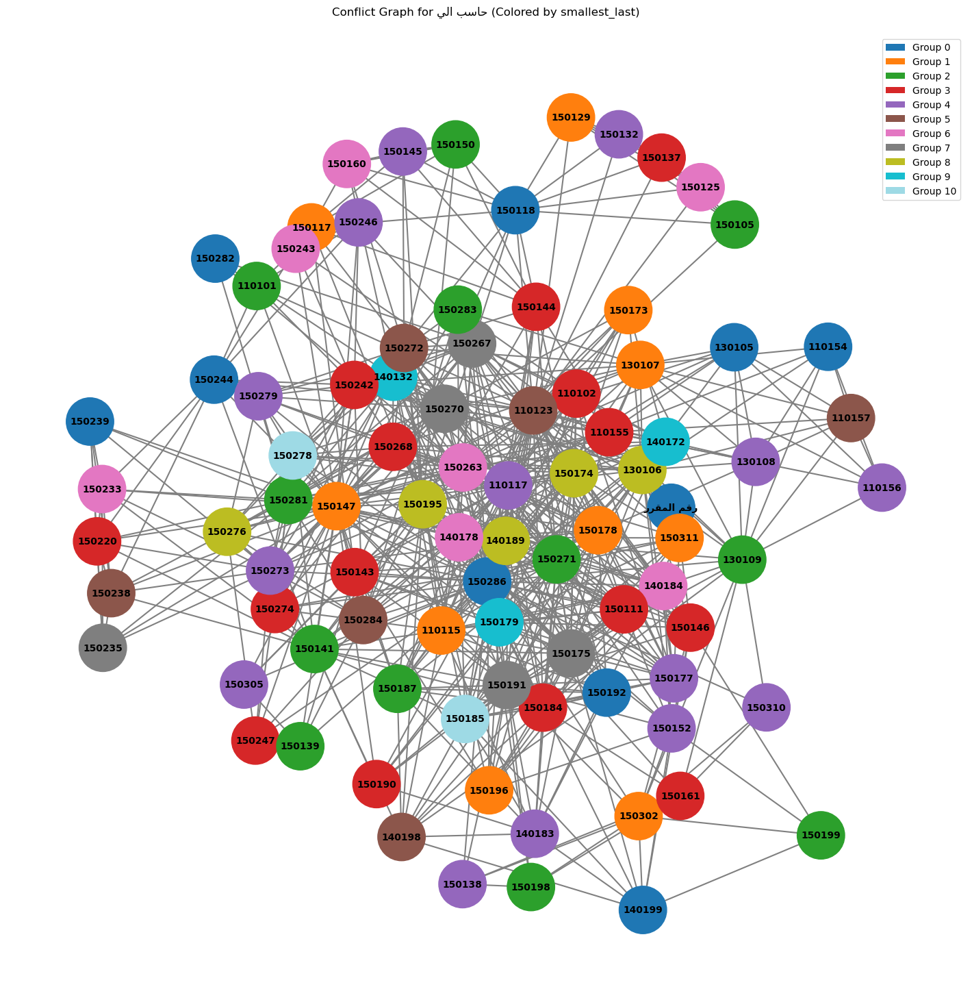

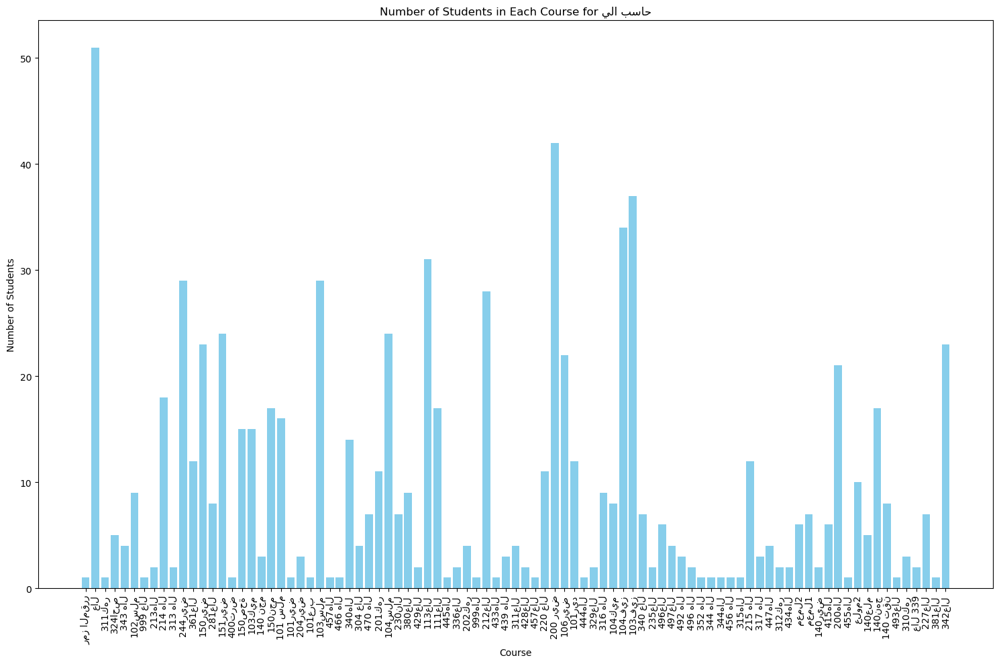

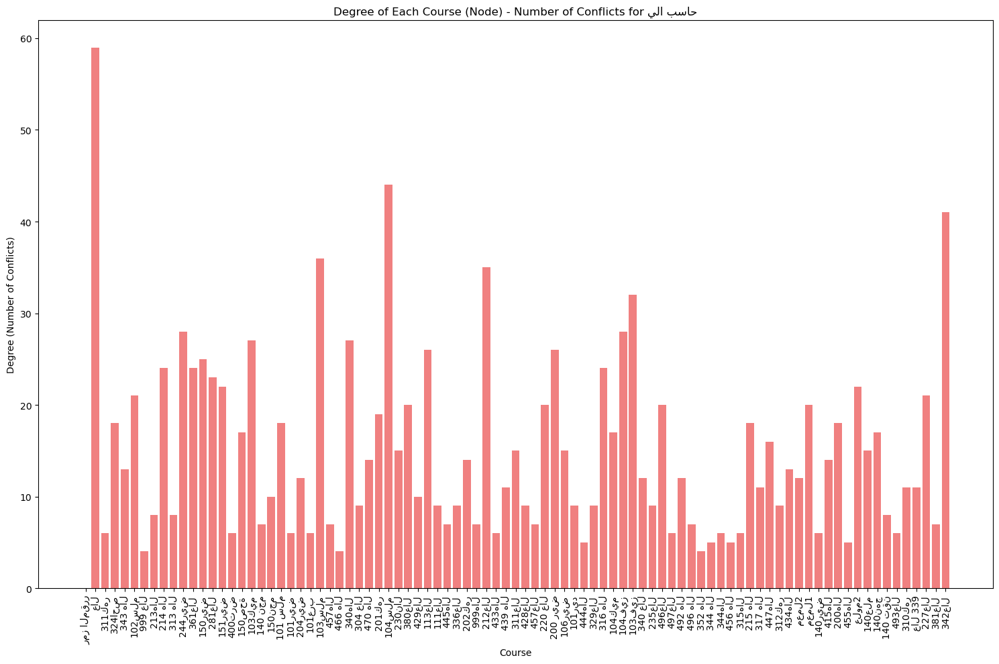

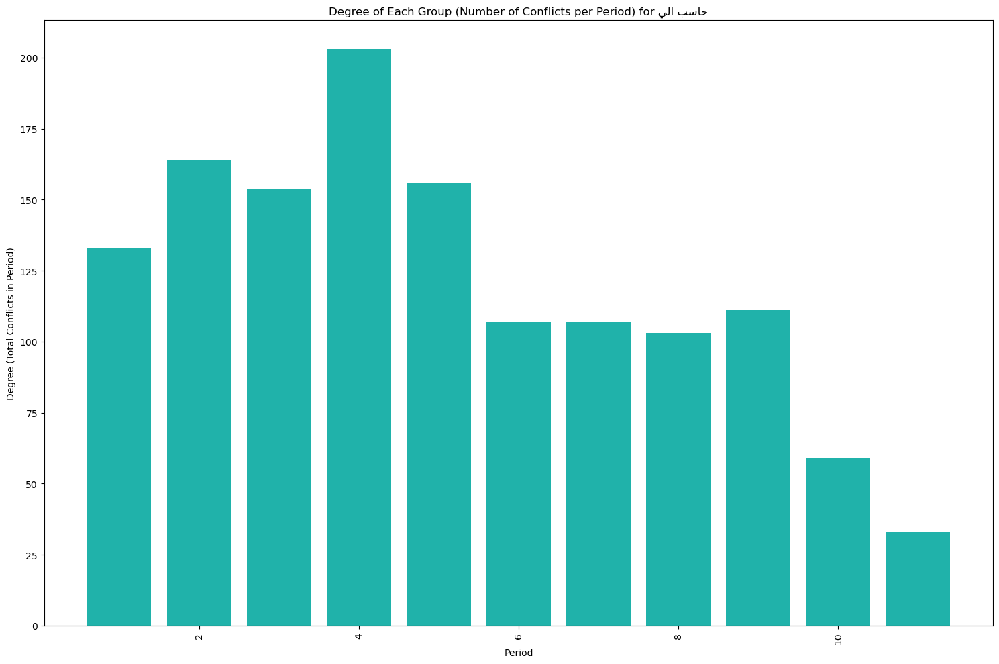

C:\Users\KimoStore\AppData\Local\Temp\ipykernel_8560\1413260652.py:131: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', num_colors)
C:\Users\KimoStore\AppData\Local\Temp\ipykernel_8560\1413260652.py:148: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


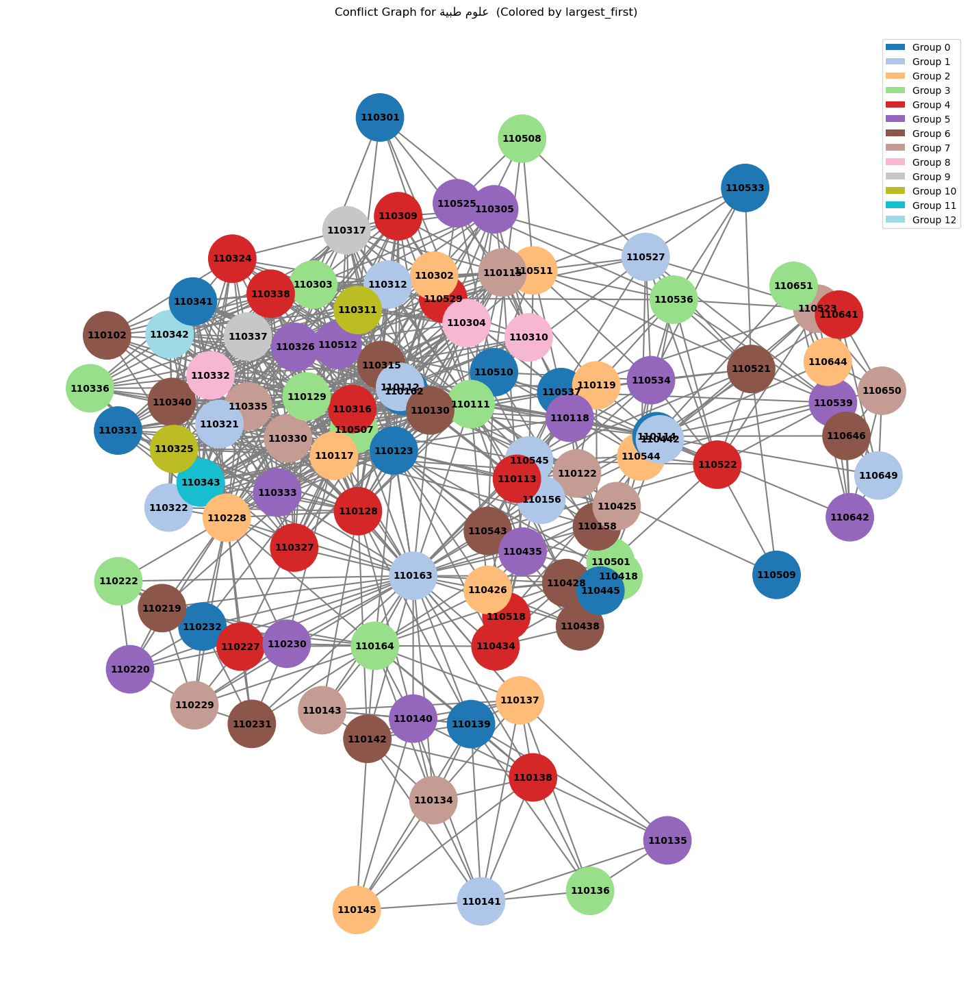

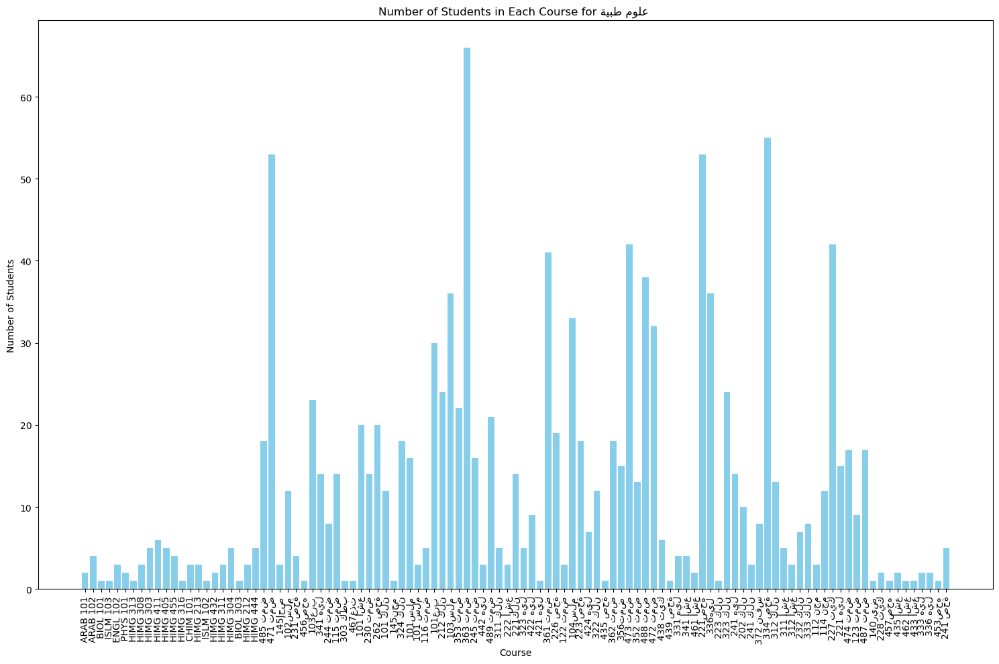

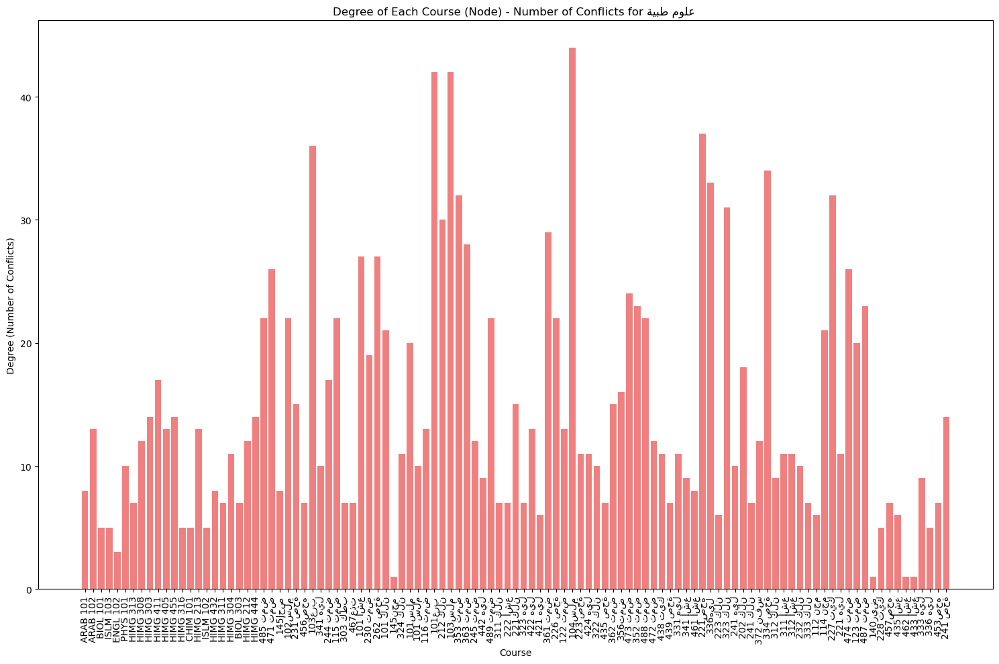

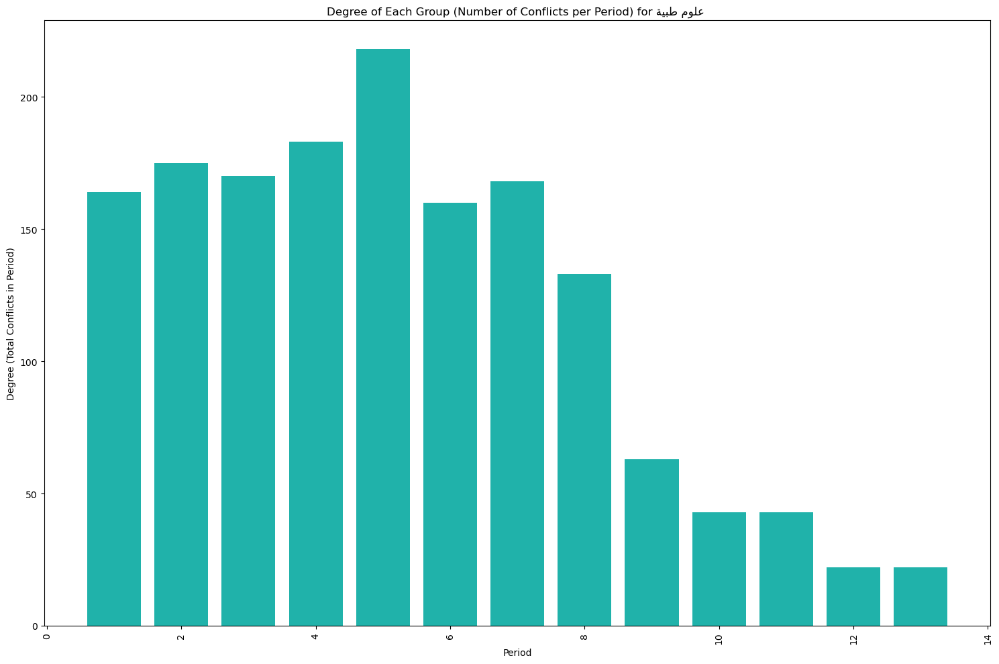

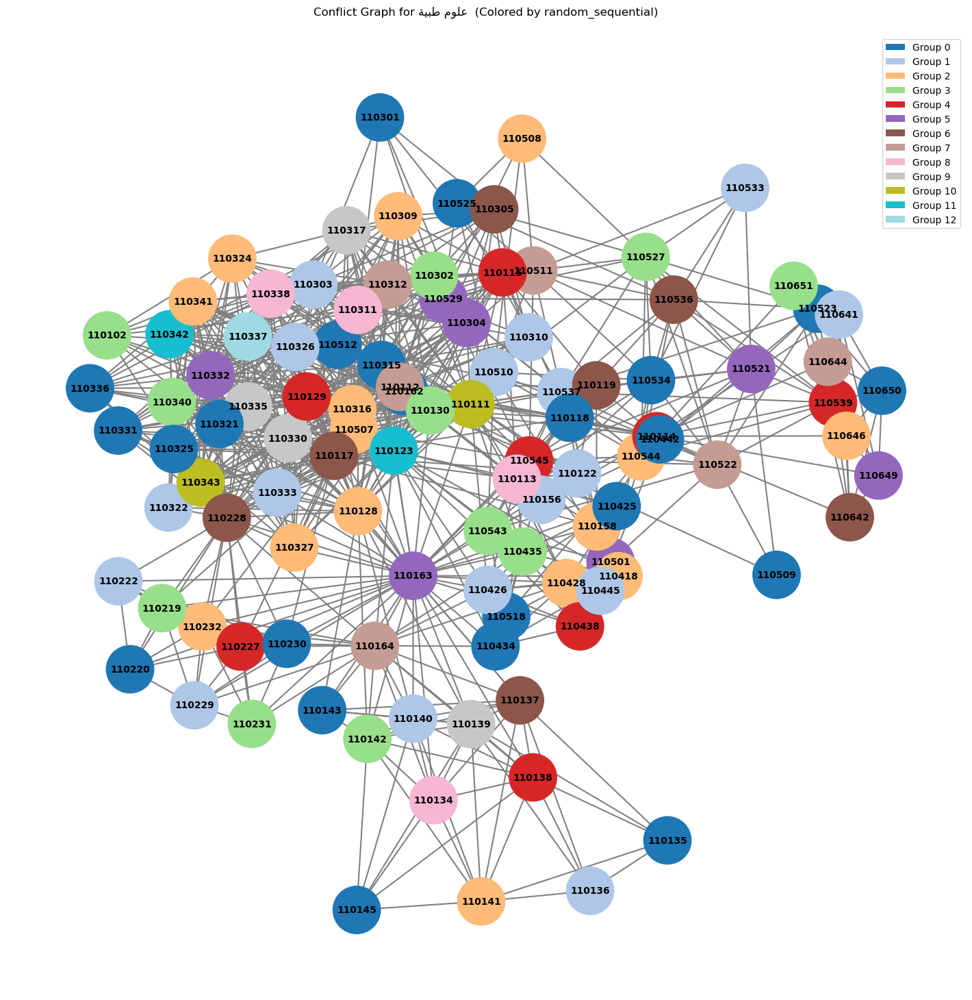

...

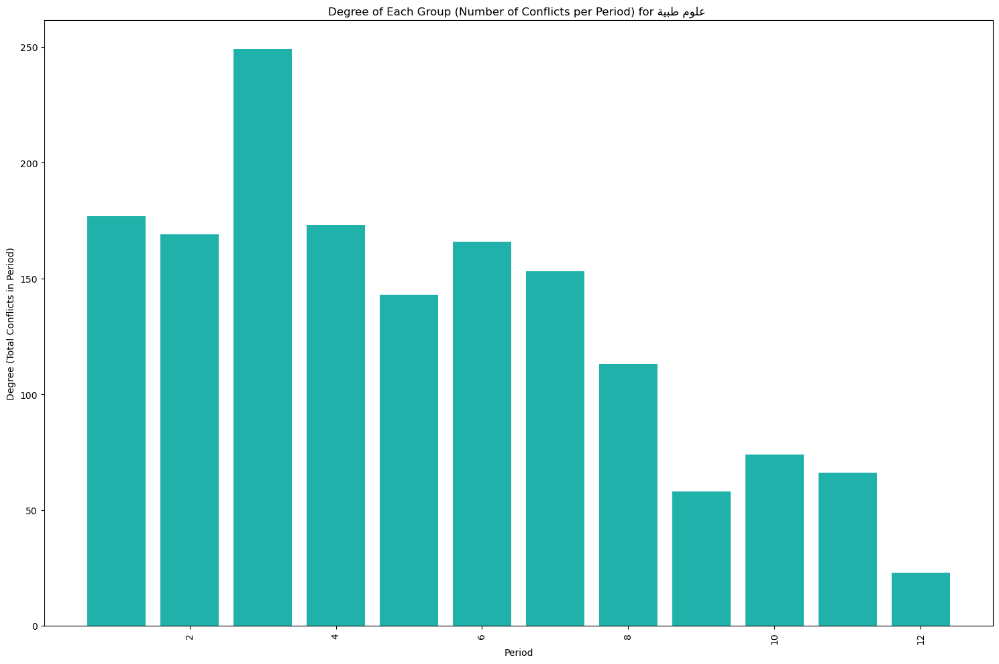

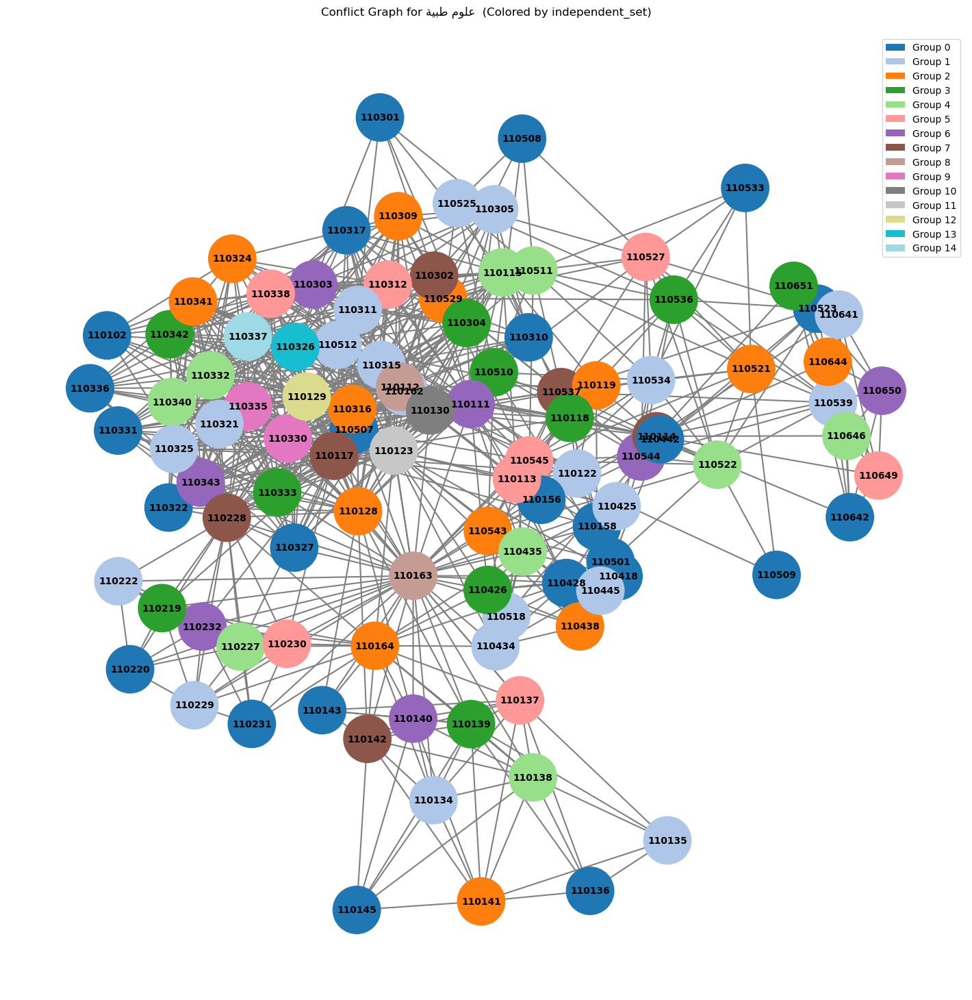

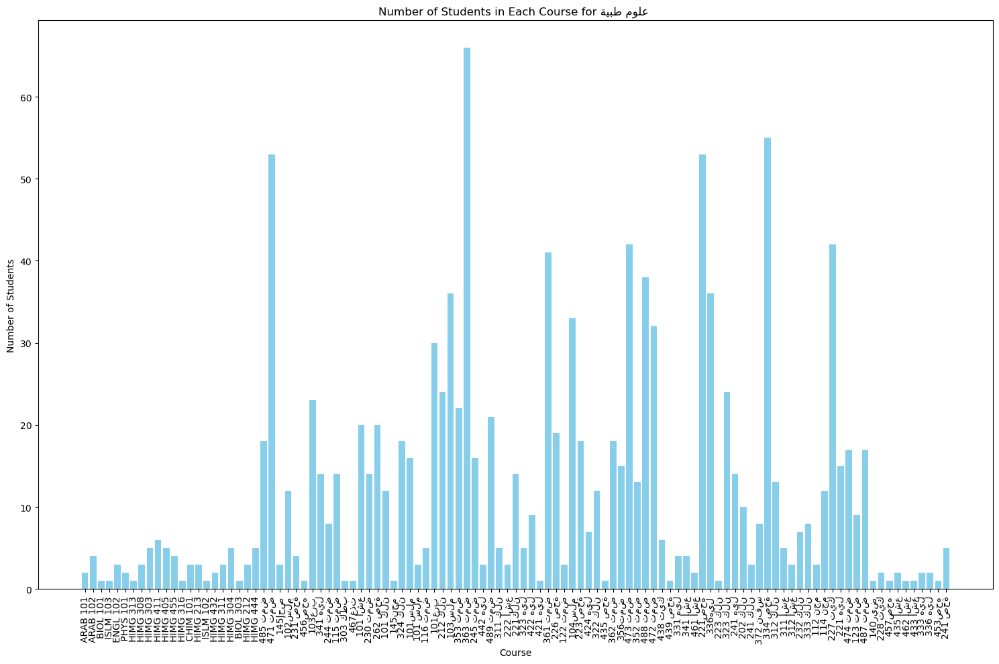

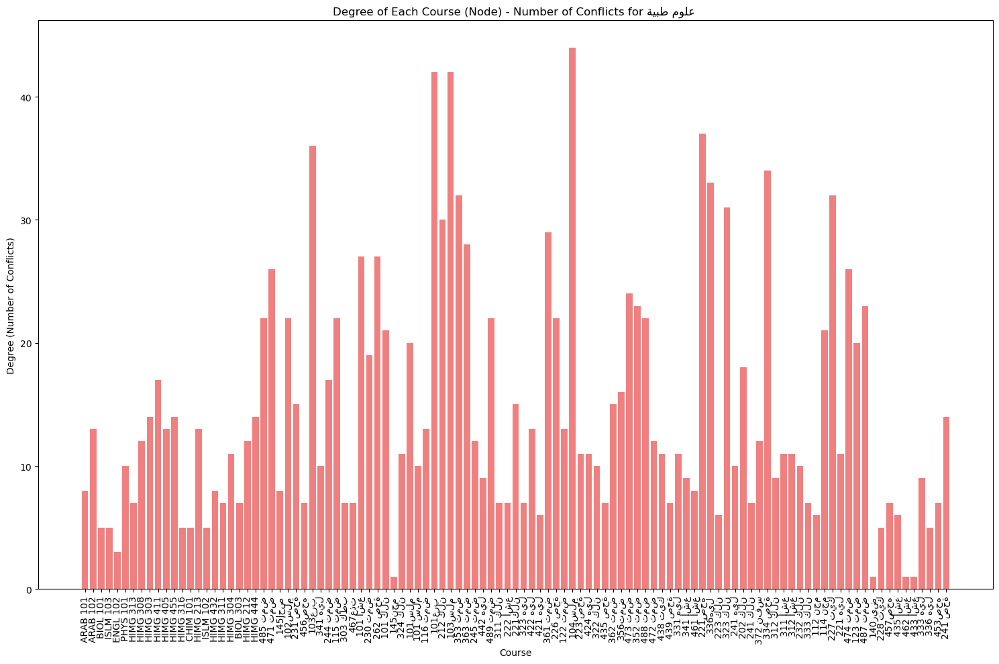

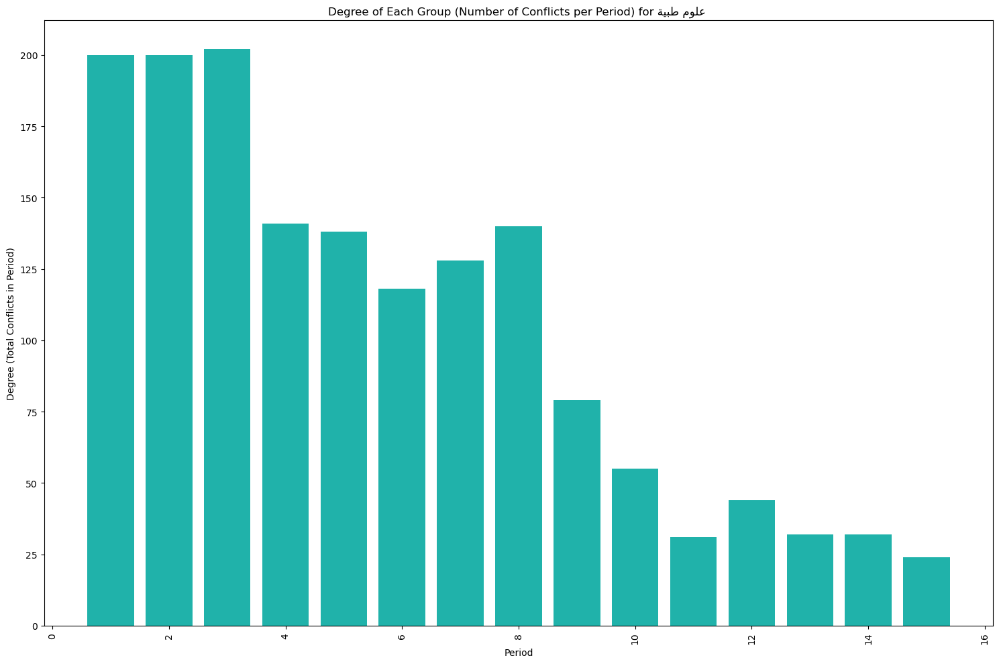

⚠ largest_first Algorithm - Sheet: صيدلة وطب اسنان - Period 3 exceeds max students per day (201)
⚠ largest_first Algorithm - Sheet: صيدلة وطب اسنان - Period 9 exceeds max students per day (231)


C:\Users\KimoStore\AppData\Local\Temp\ipykernel_8560\1413260652.py:131: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', num_colors)
C:\Users\KimoStore\AppData\Local\Temp\ipykernel_8560\1413260652.py:148: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


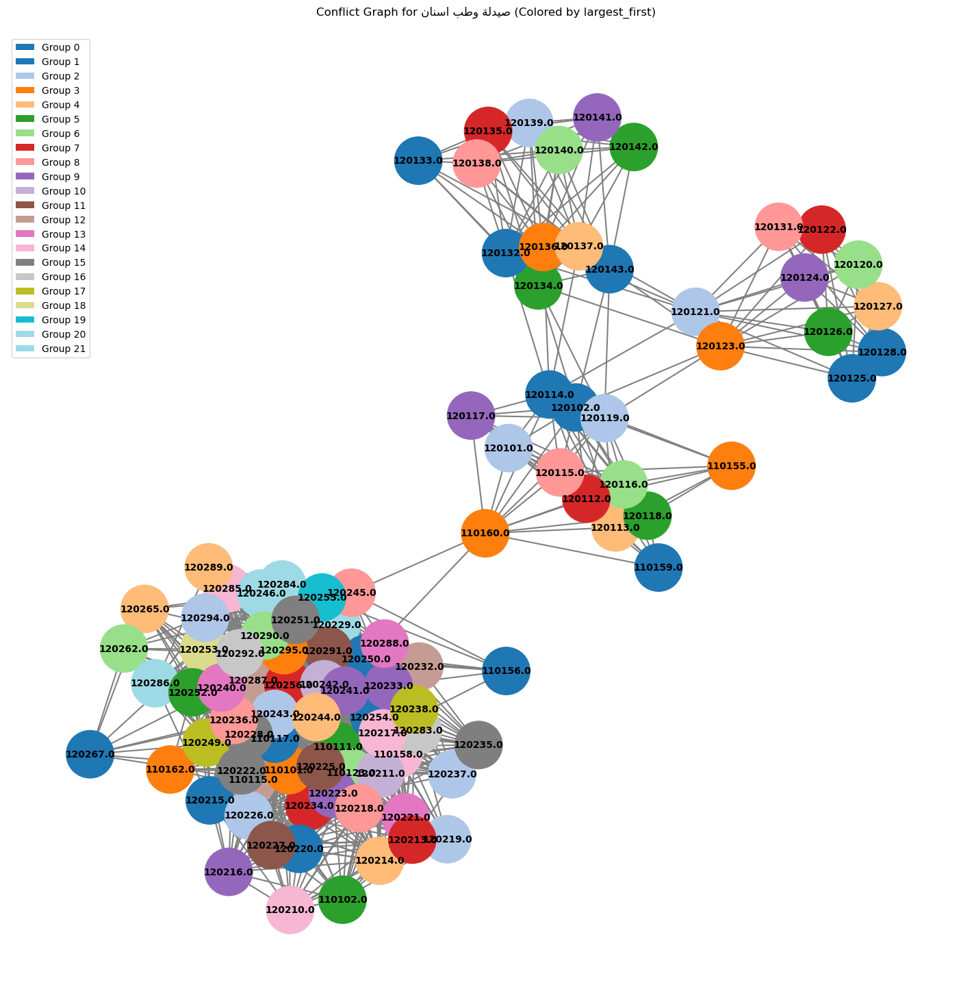

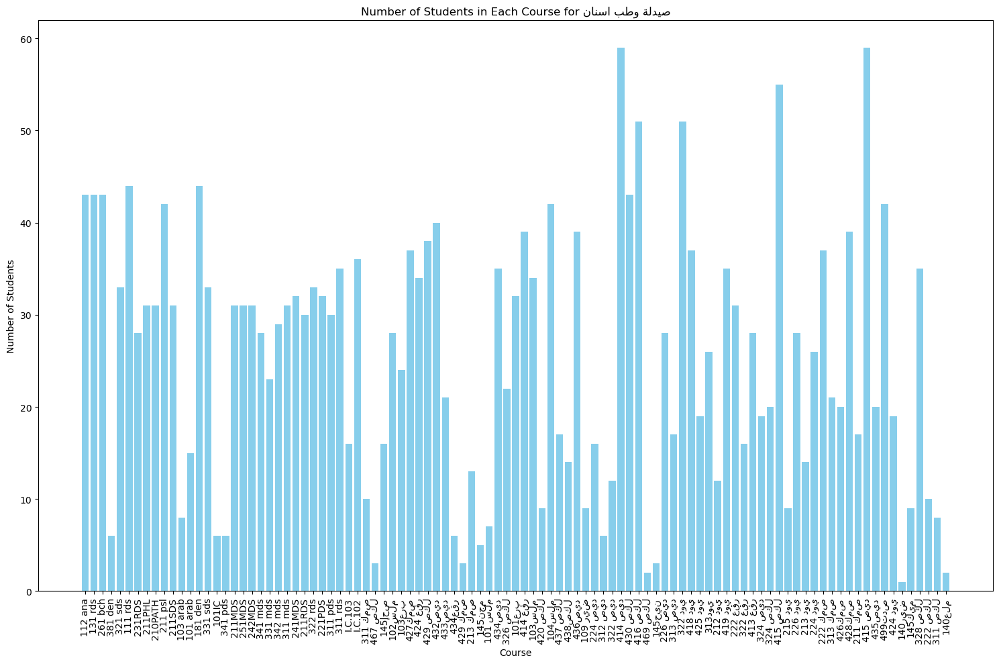

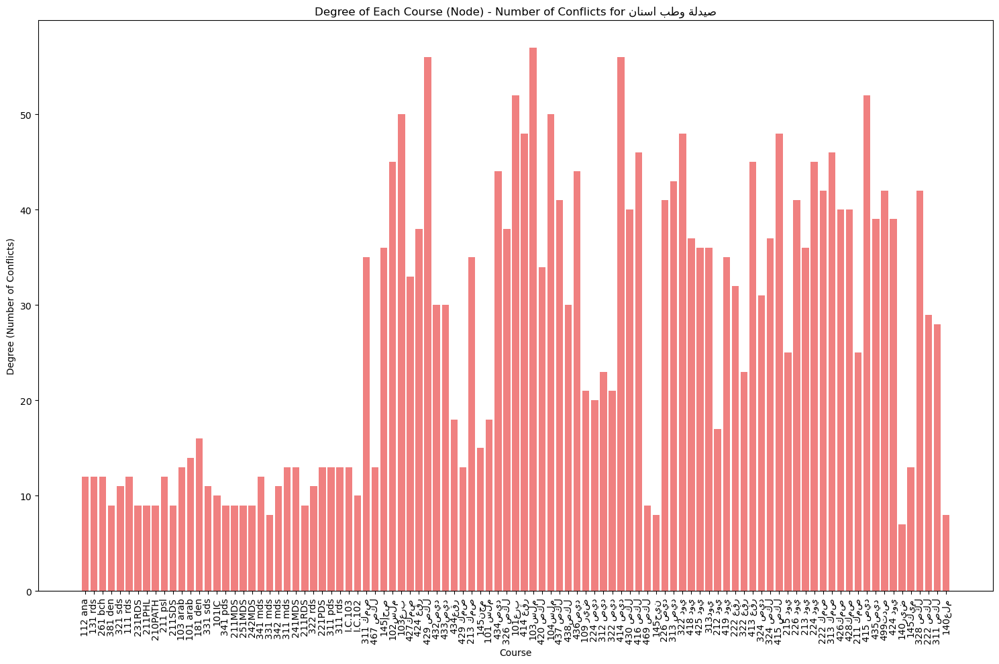

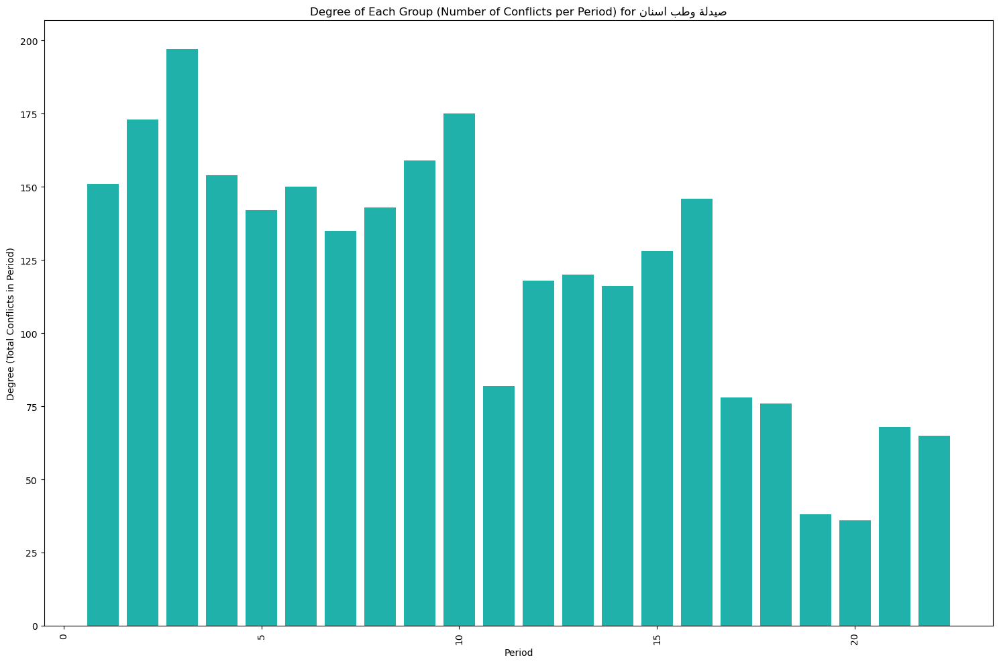

⚠ random_sequential Algorithm - Sheet: صيدلة وطب اسنان - Period 10 exceeds max students per day (218)


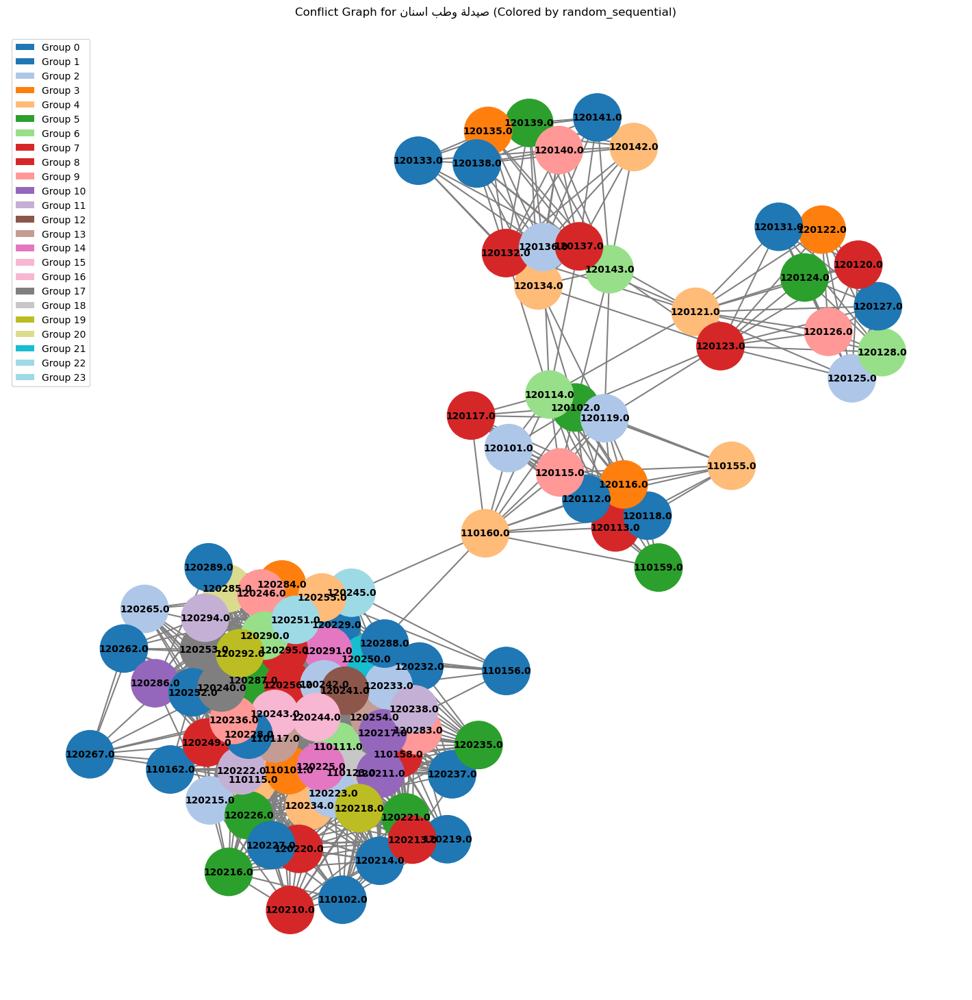

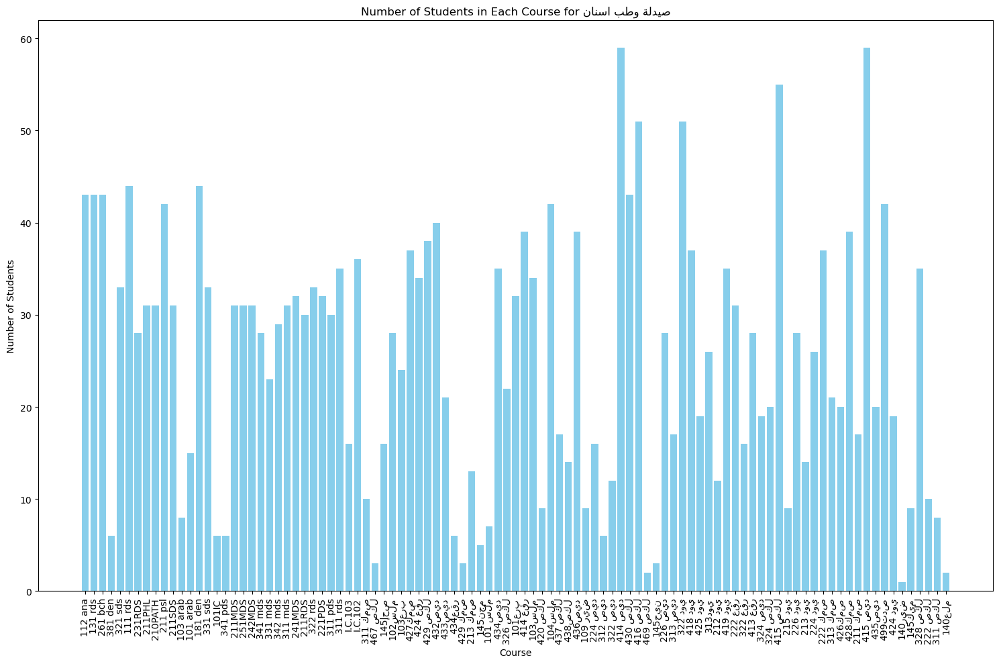

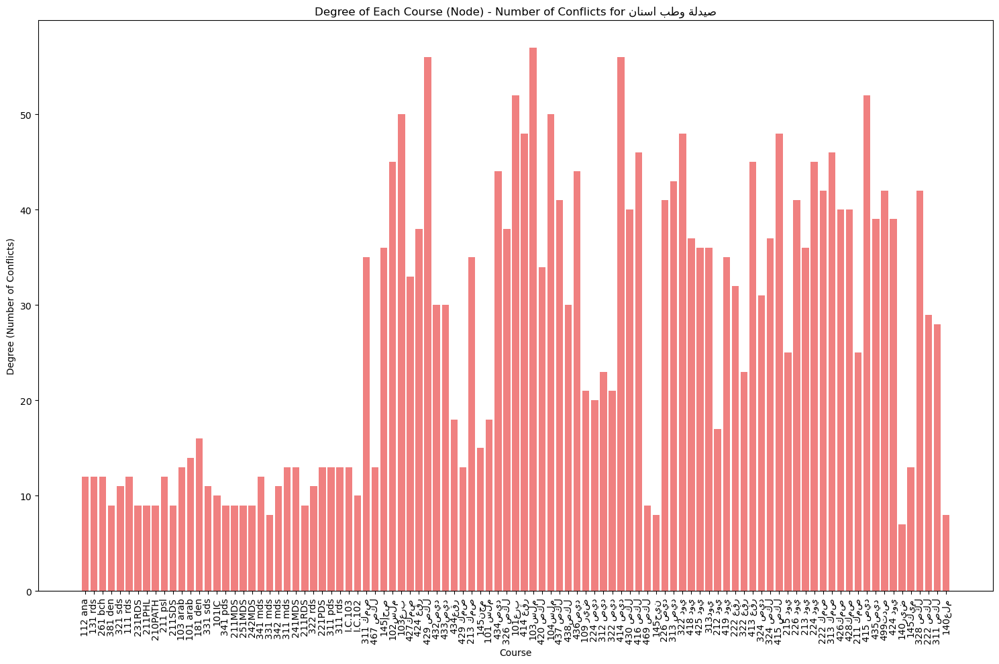

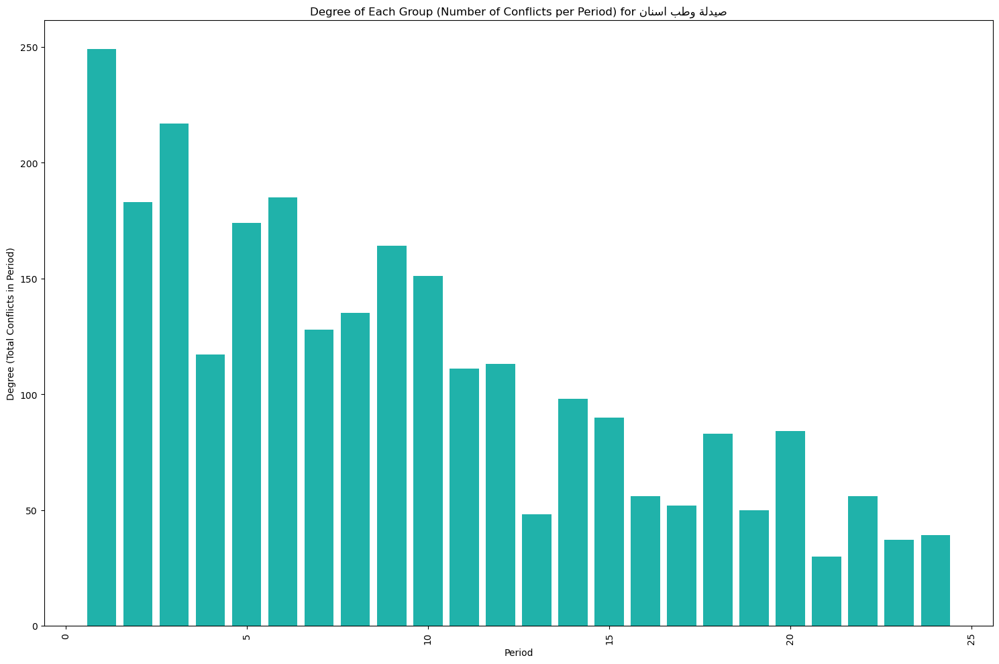

⚠ smallest_last Algorithm - Sheet: صيدلة وطب اسنان - Period 2 exceeds max students per day (231)


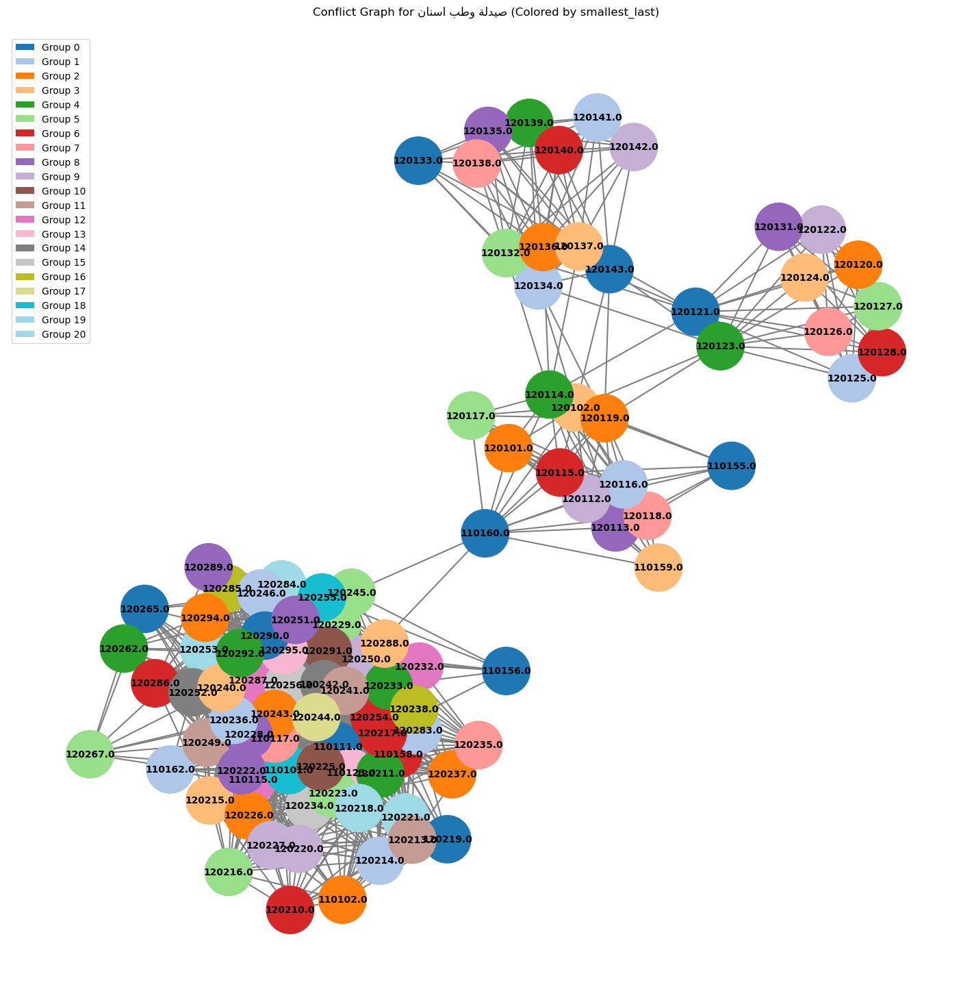

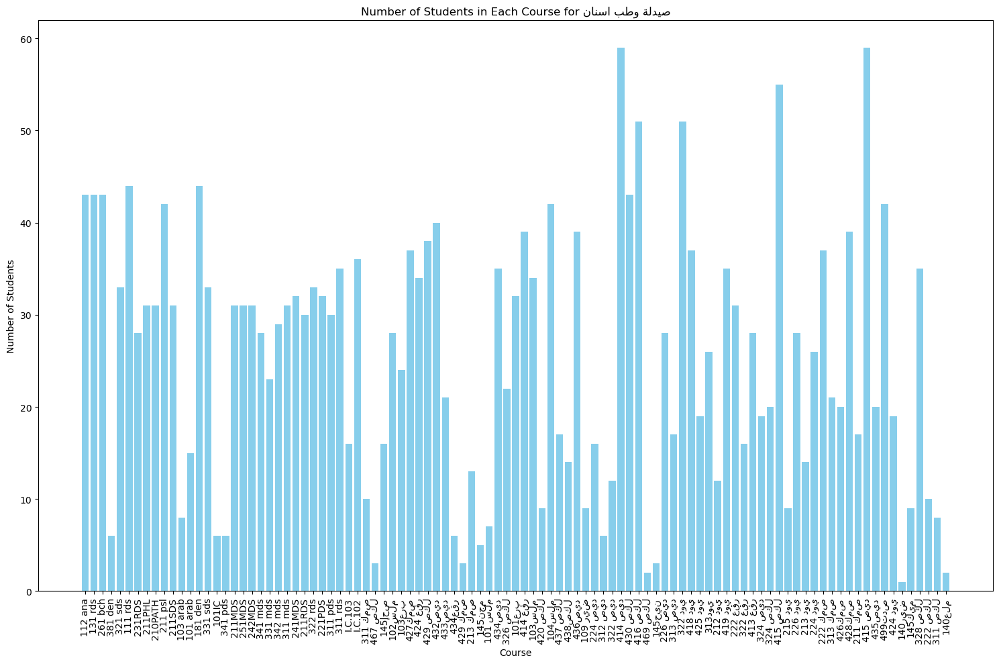

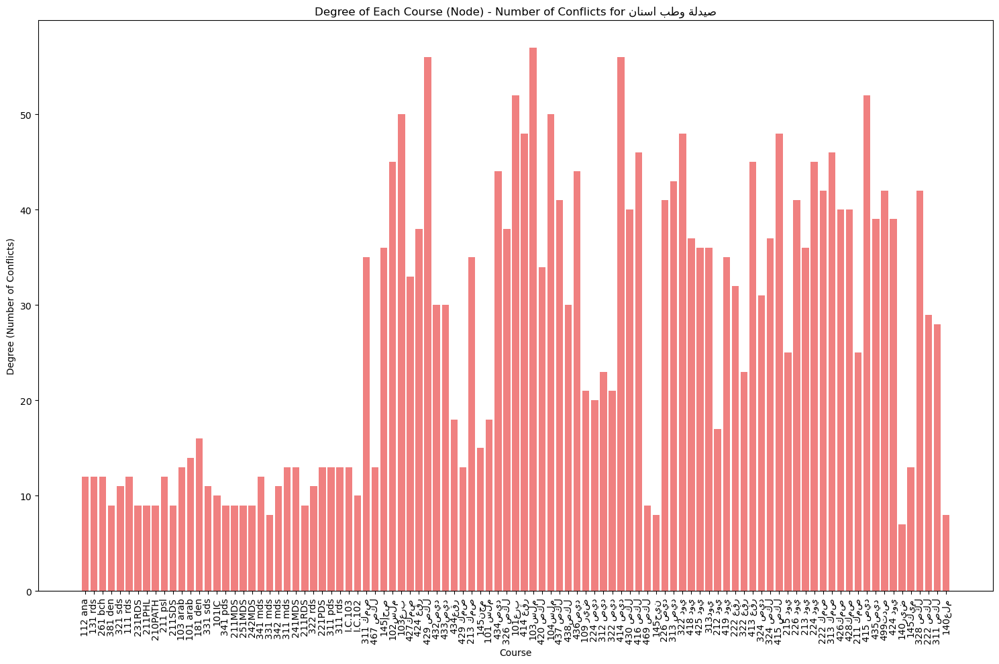

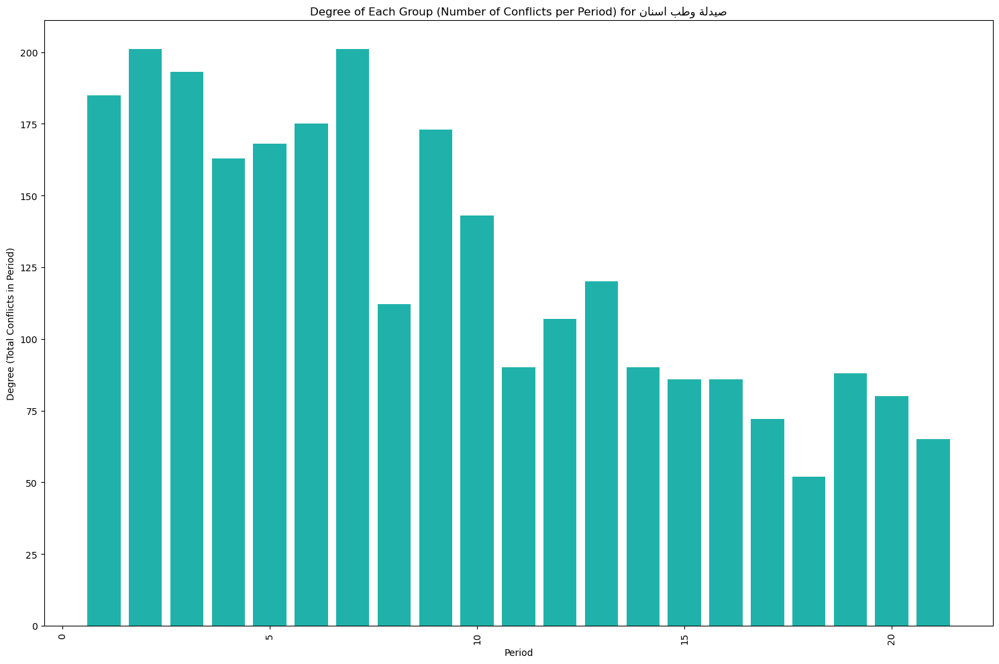

⚠ independent_set Algorithm - Sheet: صيدلة وطب اسنان - Period 1 exceeds max students per day (217)
⚠ independent_set Algorithm - Sheet: صيدلة وطب اسنان - Period 5 exceeds max students per day (232)


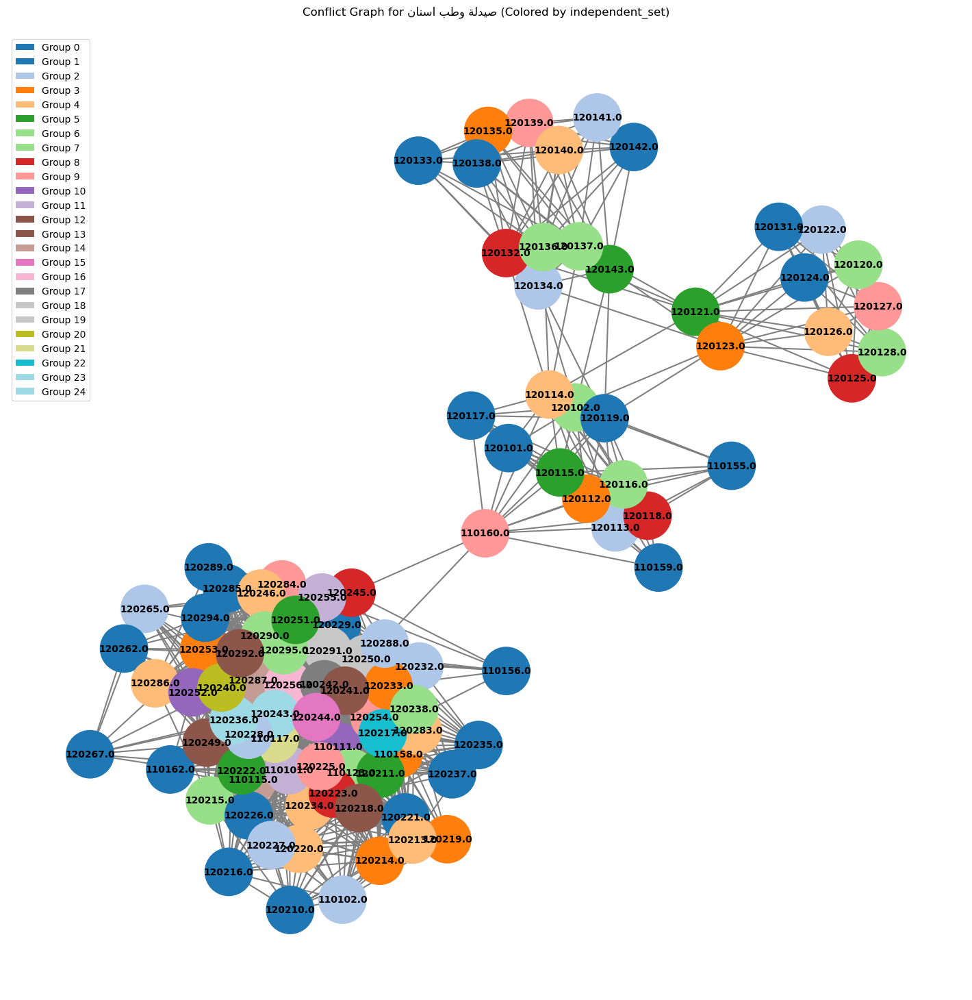

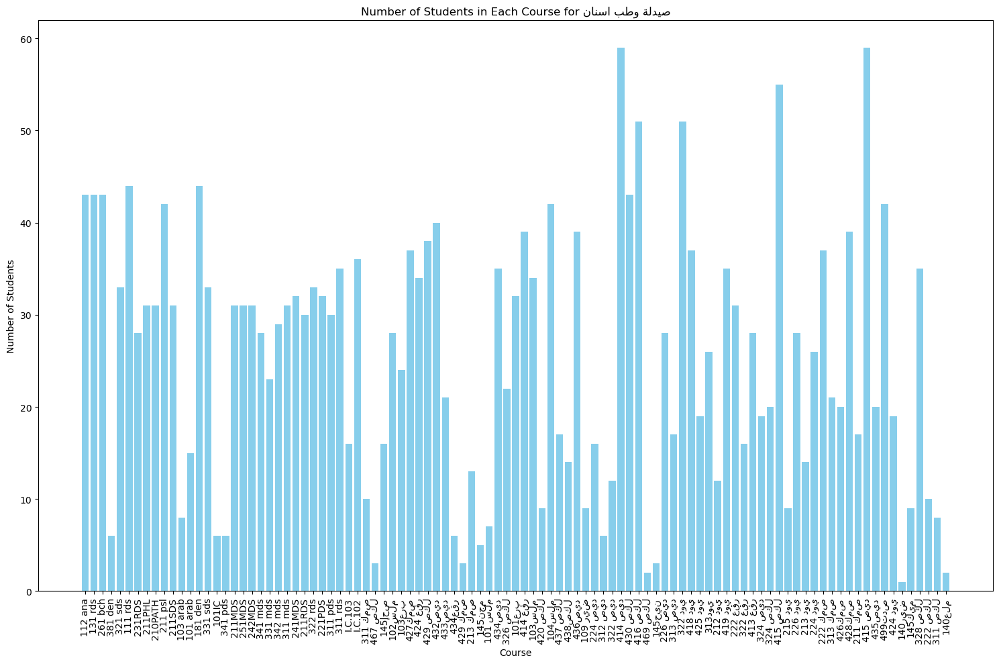

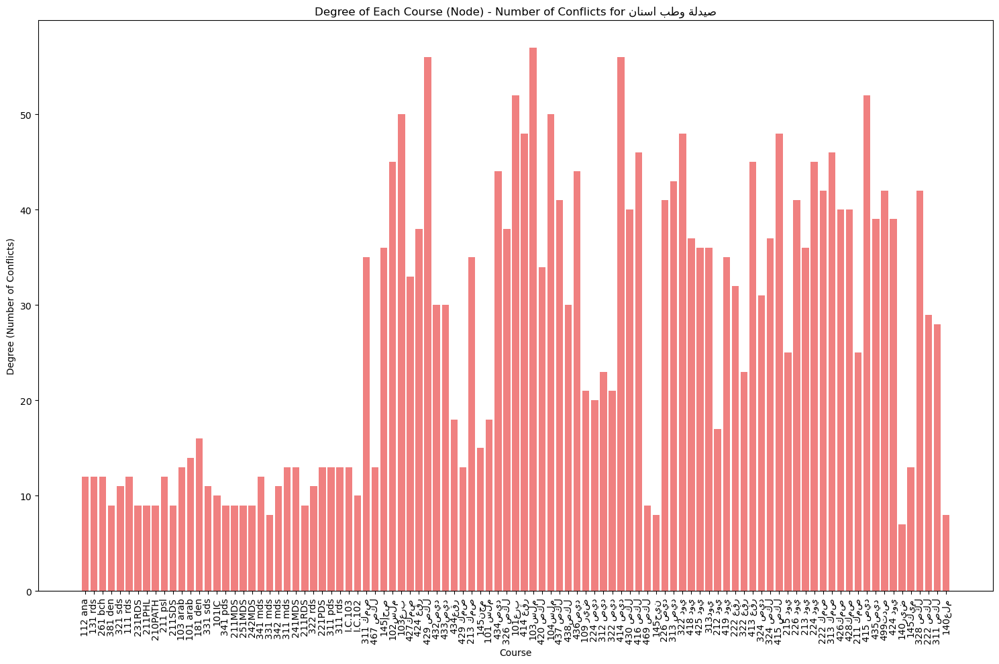

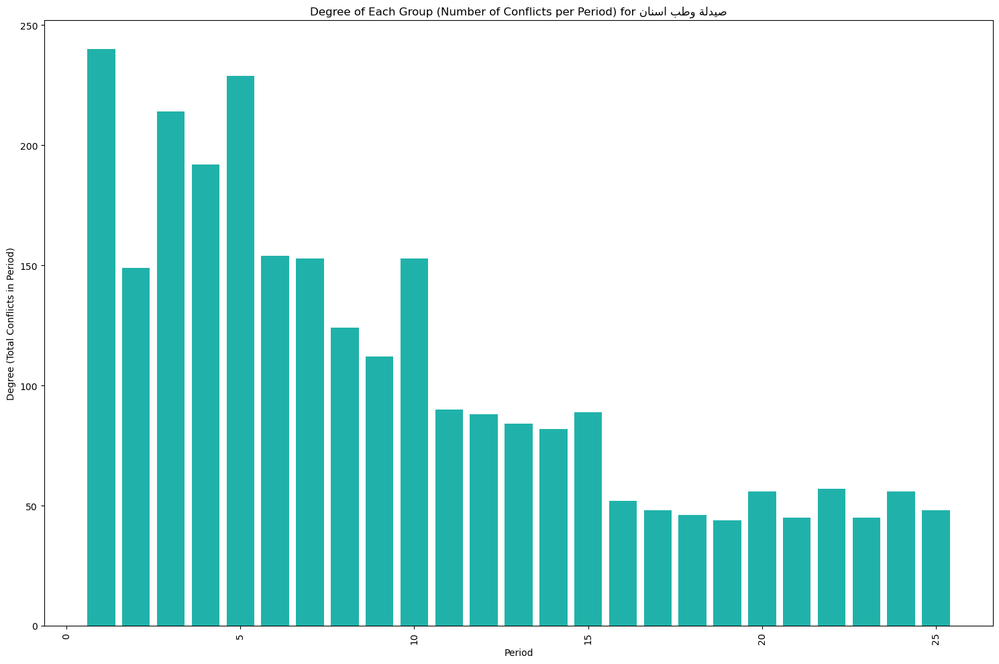

⚠ largest_first Algorithm - Sheet: العلوم الادارية - Period 1 exceeds max students per day (407)
⚠ largest_first Algorithm - Sheet: العلوم الادارية - Period 2 exceeds max students per day (419)
⚠ largest_first Algorithm - Sheet: العلوم الادارية - Period 3 exceeds max students per day (427)
⚠ largest_first Algorithm - Sheet: العلوم الادارية - Period 4 exceeds max students per day (452)
⚠ largest_first Algorithm - Sheet: العلوم الادارية - Period 5 exceeds max students per day (550)
⚠ largest_first Algorithm - Sheet: العلوم الادارية - Period 6 exceeds max students per day (452)
⚠ largest_first Algorithm - Sheet: العلوم الادارية - Period 7 exceeds max students per day (431)
⚠ largest_first Algorithm - Sheet: العلوم الادارية - Period 8 exceeds max students per day (344)
⚠ largest_first Algorithm - Sheet: العلوم الادارية - Period 9 exceeds max students per day (438)
⚠ largest_first Algorithm - Sheet: العلوم الادارية - Period 10 exceeds max students per day (325)
⚠ largest_first Algorithm - S

C:\Users\KimoStore\AppData\Local\Temp\ipykernel_8560\1413260652.py:131: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', num_colors)
C:\Users\KimoStore\AppData\Local\Temp\ipykernel_8560\1413260652.py:148: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


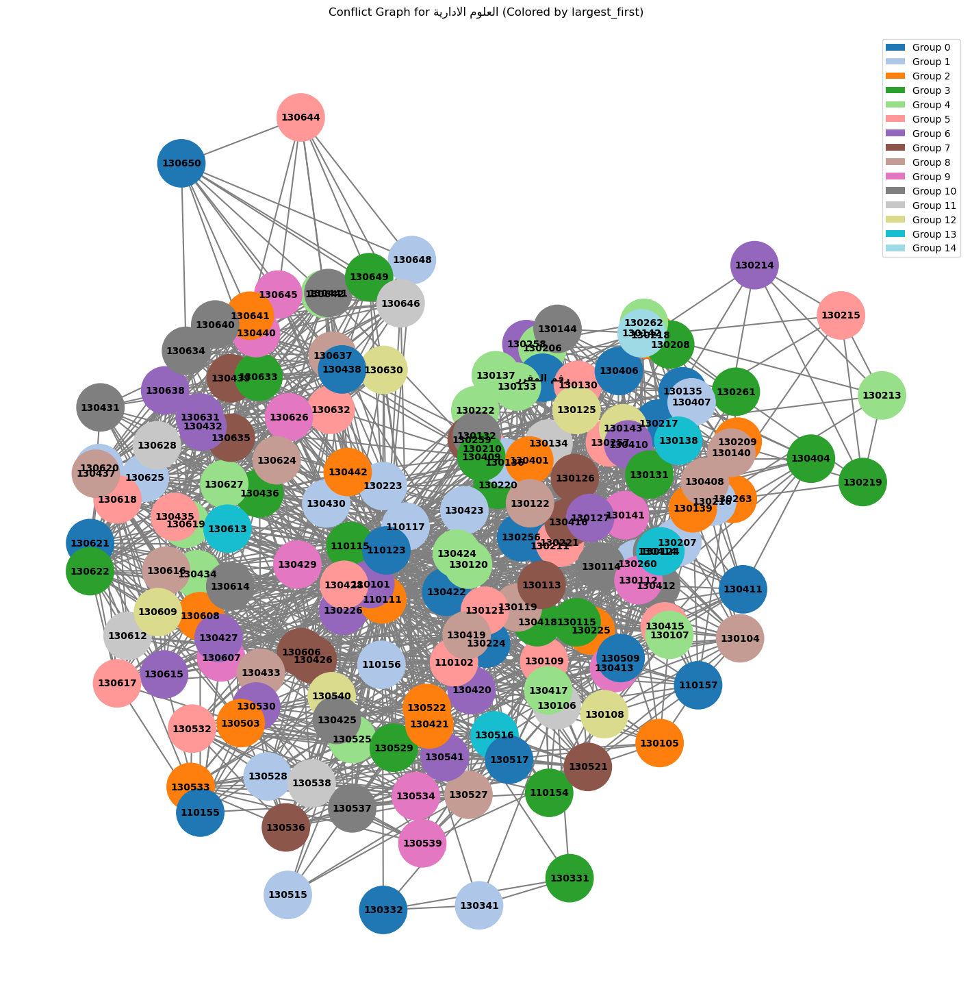

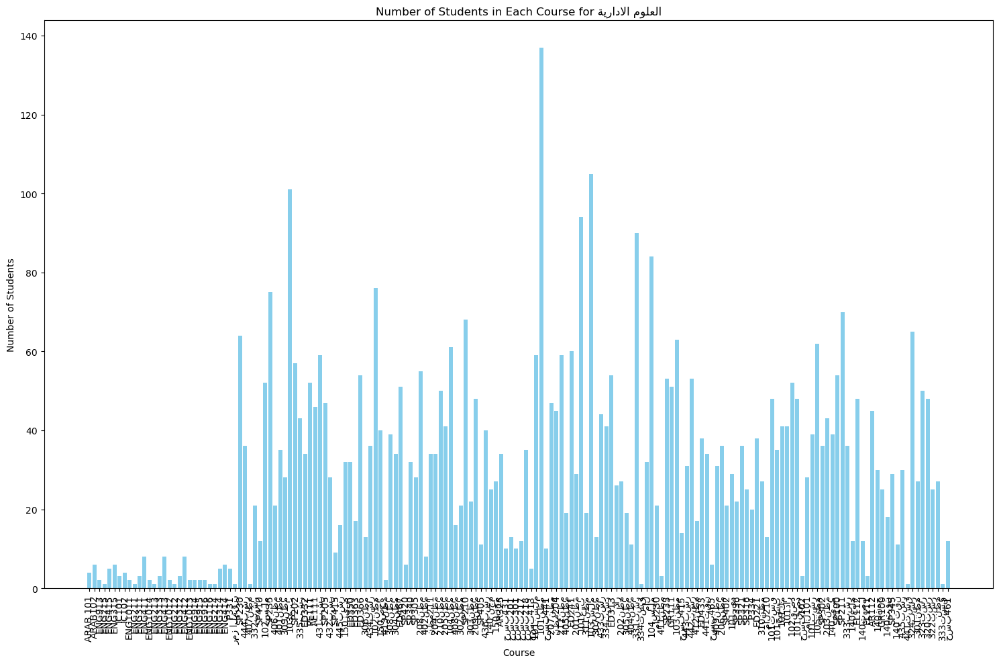

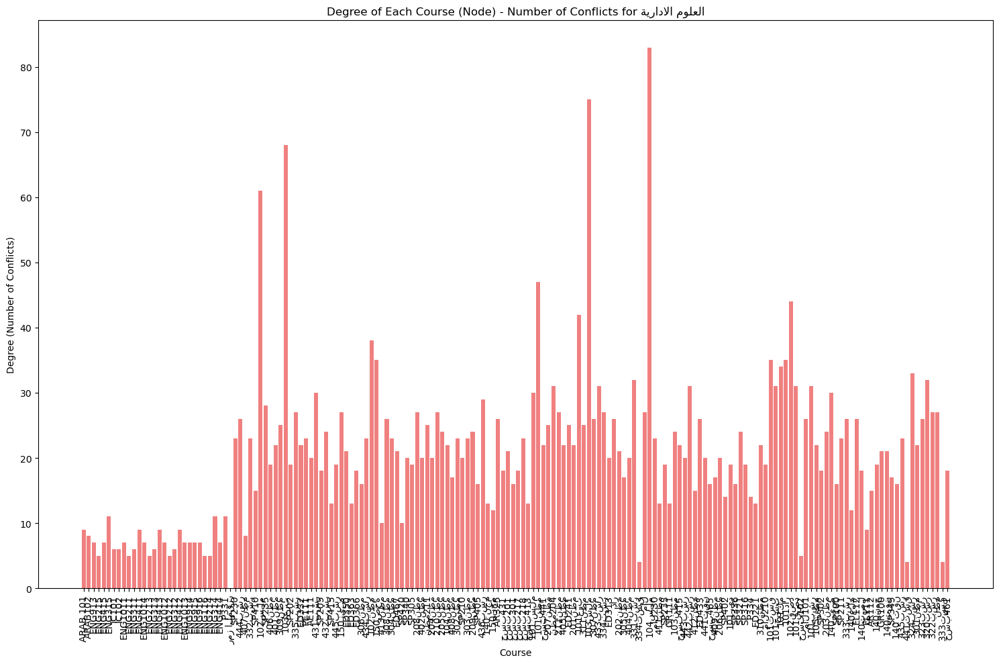

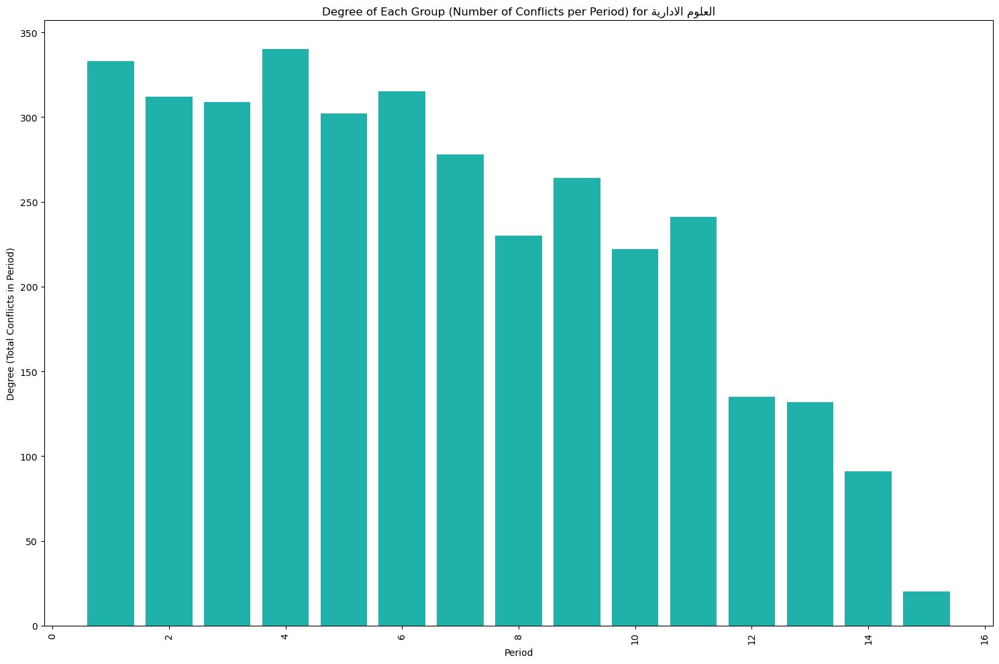

⚠ random_sequential Algorithm - Sheet: العلوم الادارية - Period 1 exceeds max students per day (390)
⚠ random_sequential Algorithm - Sheet: العلوم الادارية - Period 2 exceeds max students per day (419)
⚠ random_sequential Algorithm - Sheet: العلوم الادارية - Period 3 exceeds max students per day (439)
⚠ random_sequential Algorithm - Sheet: العلوم الادارية - Period 4 exceeds max students per day (317)
⚠ random_sequential Algorithm - Sheet: العلوم الادارية - Period 5 exceeds max students per day (392)
⚠ random_sequential Algorithm - Sheet: العلوم الادارية - Period 6 exceeds max students per day (330)
⚠ random_sequential Algorithm - Sheet: العلوم الادارية - Period 7 exceeds max students per day (335)
⚠ random_sequential Algorithm - Sheet: العلوم الادارية - Period 8 exceeds max students per day (299)
⚠ random_sequential Algorithm - Sheet: العلوم الادارية - Period 9 exceeds max students per day (388)
⚠ random_sequential Algorithm - Sheet: العلوم الادارية - Period 10 exceeds max students per

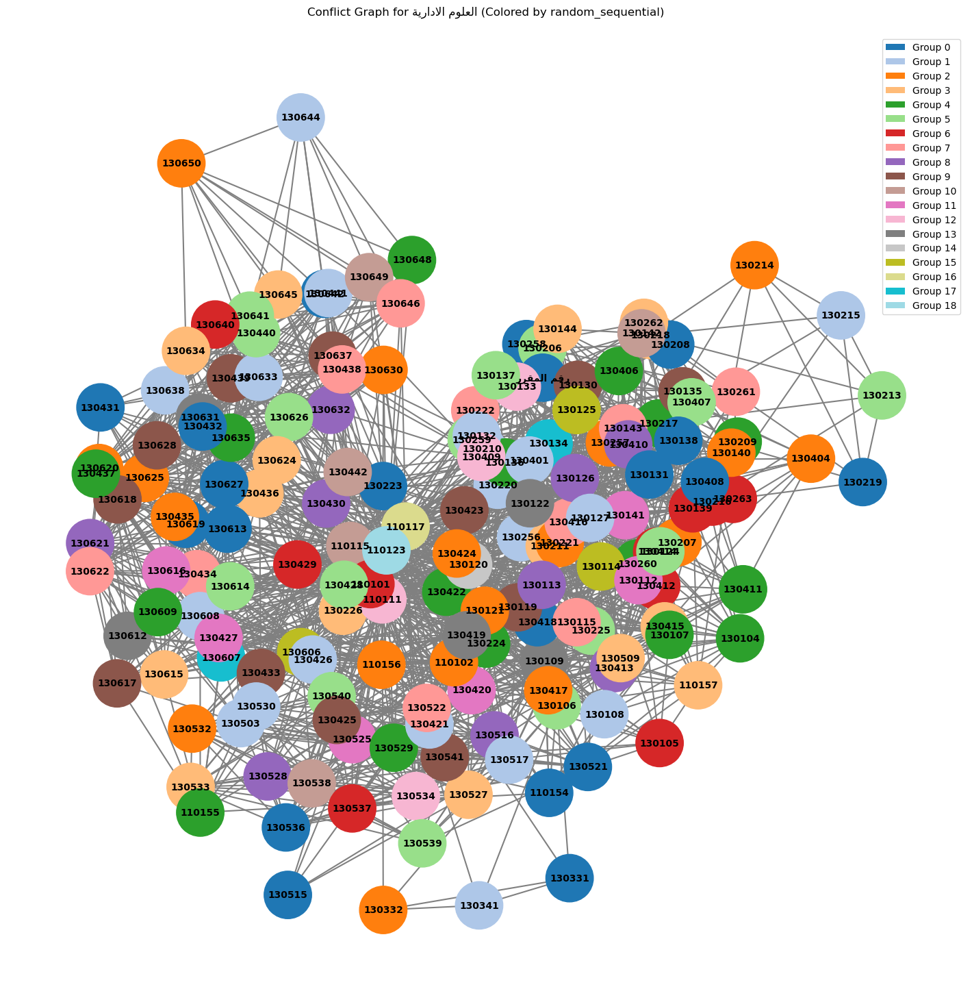

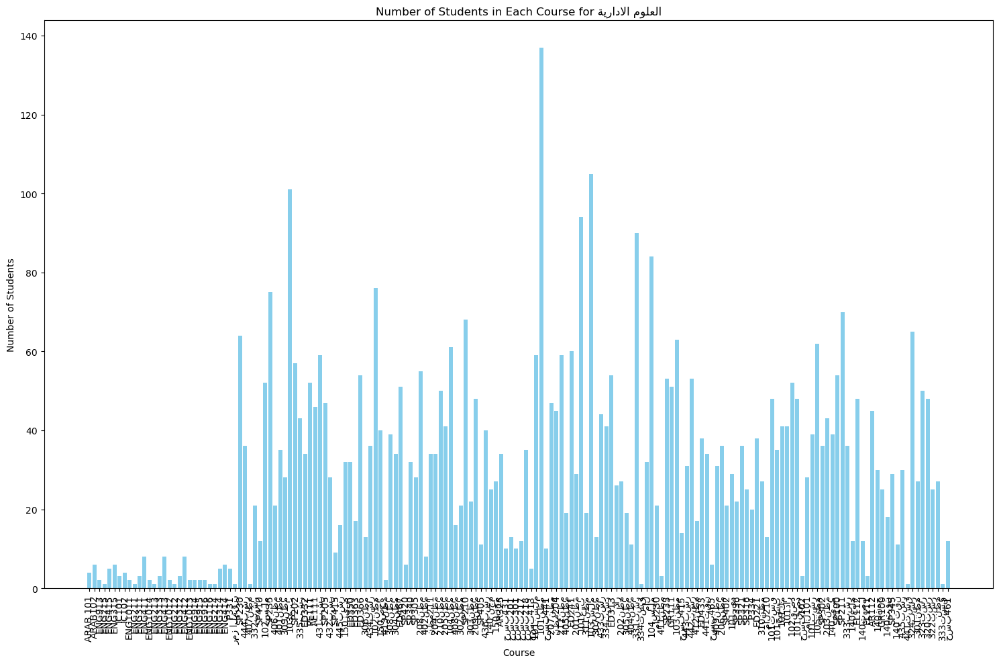

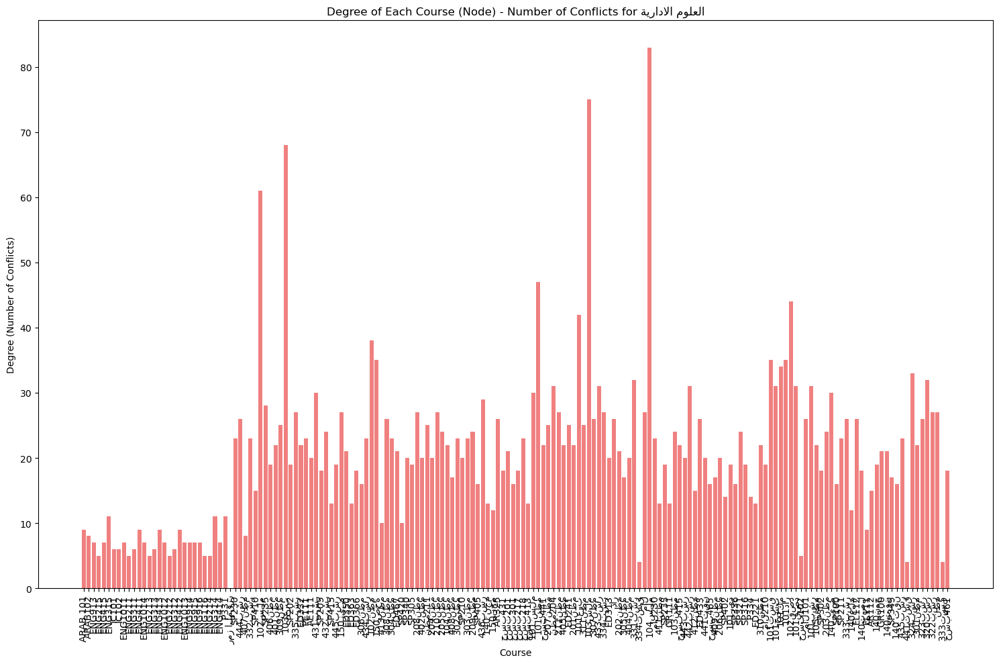

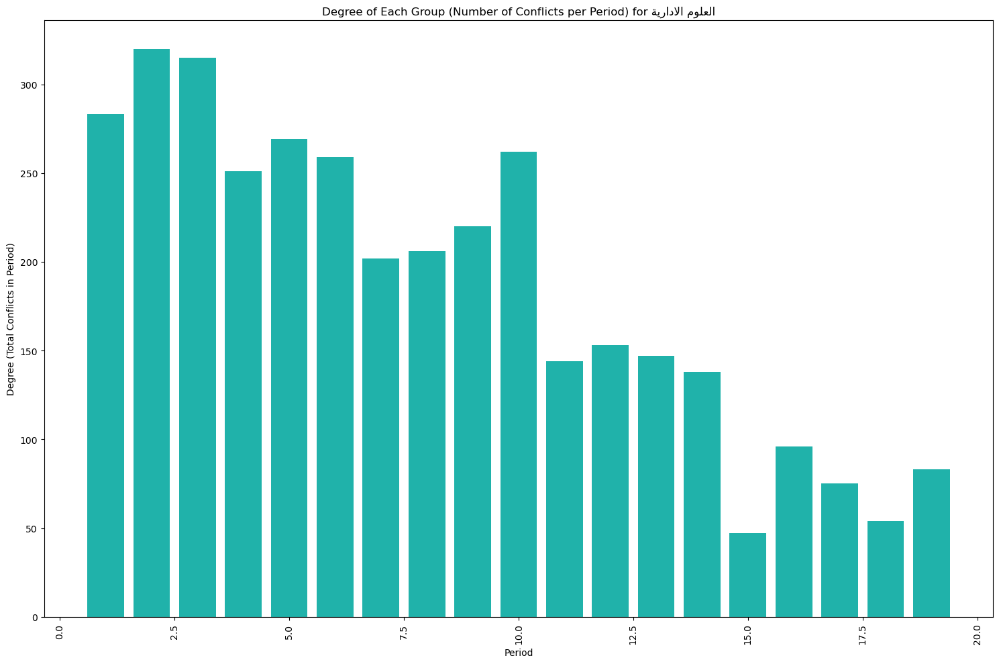

⚠ smallest_last Algorithm - Sheet: العلوم الادارية - Period 1 exceeds max students per day (575)
⚠ smallest_last Algorithm - Sheet: العلوم الادارية - Period 2 exceeds max students per day (536)
⚠ smallest_last Algorithm - Sheet: العلوم الادارية - Period 3 exceeds max students per day (528)
⚠ smallest_last Algorithm - Sheet: العلوم الادارية - Period 4 exceeds max students per day (505)
⚠ smallest_last Algorithm - Sheet: العلوم الادارية - Period 5 exceeds max students per day (462)
⚠ smallest_last Algorithm - Sheet: العلوم الادارية - Period 6 exceeds max students per day (504)
⚠ smallest_last Algorithm - Sheet: العلوم الادارية - Period 7 exceeds max students per day (378)
⚠ smallest_last Algorithm - Sheet: العلوم الادارية - Period 8 exceeds max students per day (394)
⚠ smallest_last Algorithm - Sheet: العلوم الادارية - Period 9 exceeds max students per day (399)
⚠ smallest_last Algorithm - Sheet: العلوم الادارية - Period 10 exceeds max students per day (266)
⚠ smallest_last Algorithm - S

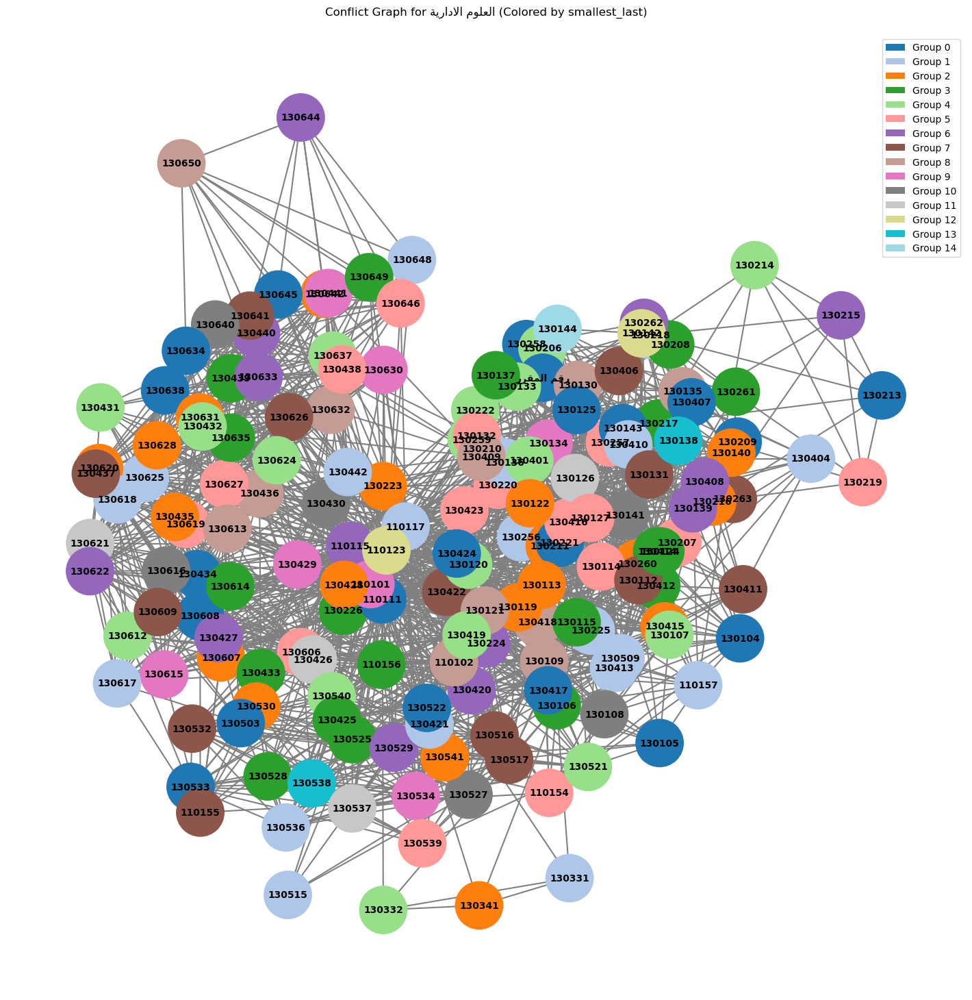

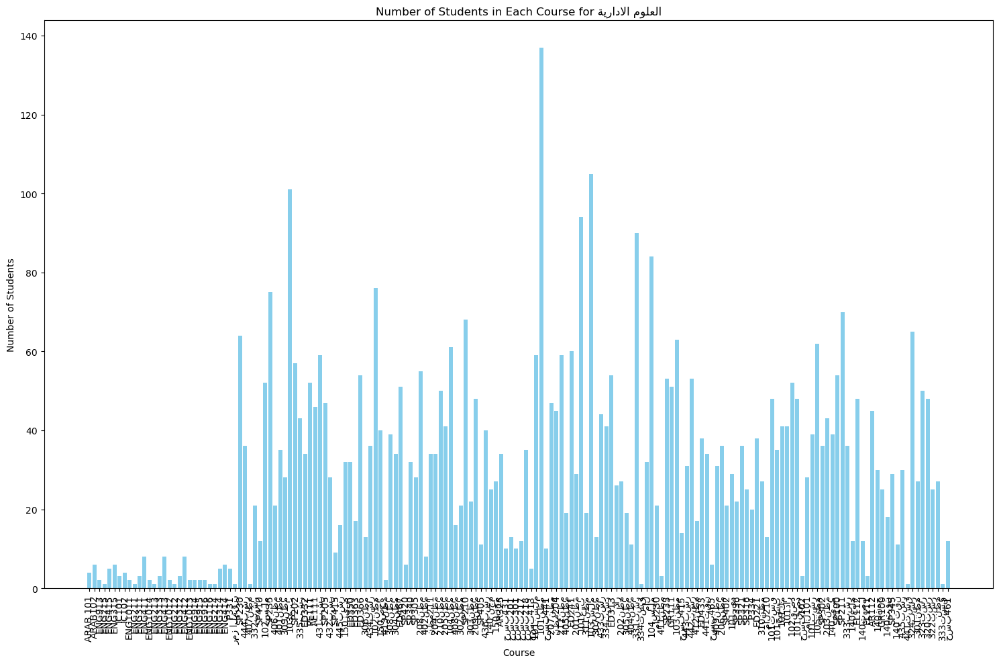

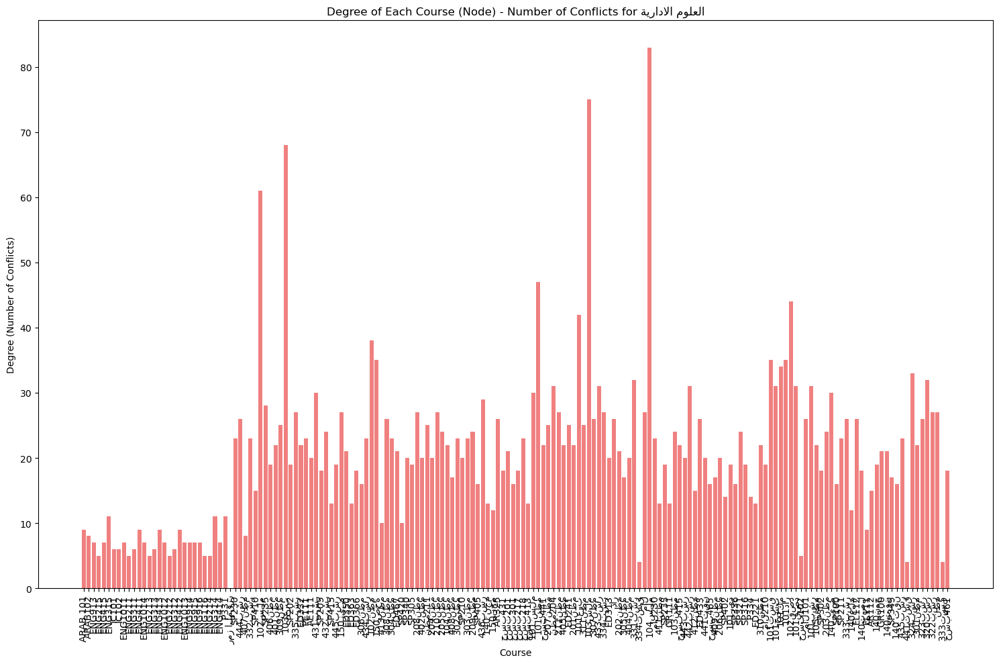

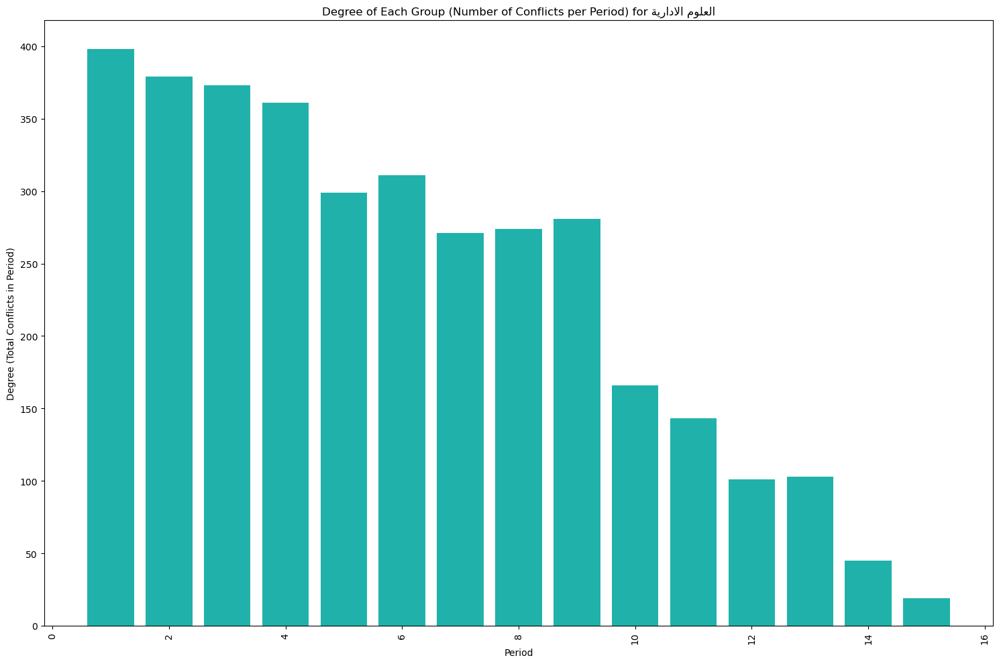

⚠ independent_set Algorithm - Sheet: العلوم الادارية - Period 1 exceeds max students per day (519)
⚠ independent_set Algorithm - Sheet: العلوم الادارية - Period 2 exceeds max students per day (442)
⚠ independent_set Algorithm - Sheet: العلوم الادارية - Period 3 exceeds max students per day (459)
⚠ independent_set Algorithm - Sheet: العلوم الادارية - Period 4 exceeds max students per day (426)
⚠ independent_set Algorithm - Sheet: العلوم الادارية - Period 5 exceeds max students per day (456)
⚠ independent_set Algorithm - Sheet: العلوم الادارية - Period 6 exceeds max students per day (402)
⚠ independent_set Algorithm - Sheet: العلوم الادارية - Period 7 exceeds max students per day (328)
⚠ independent_set Algorithm - Sheet: العلوم الادارية - Period 8 exceeds max students per day (309)
⚠ independent_set Algorithm - Sheet: العلوم الادارية - Period 9 exceeds max students per day (238)
⚠ independent_set Algorithm - Sheet: العلوم الادارية - Period 10 exceeds max students per day (238)
⚠ indepen

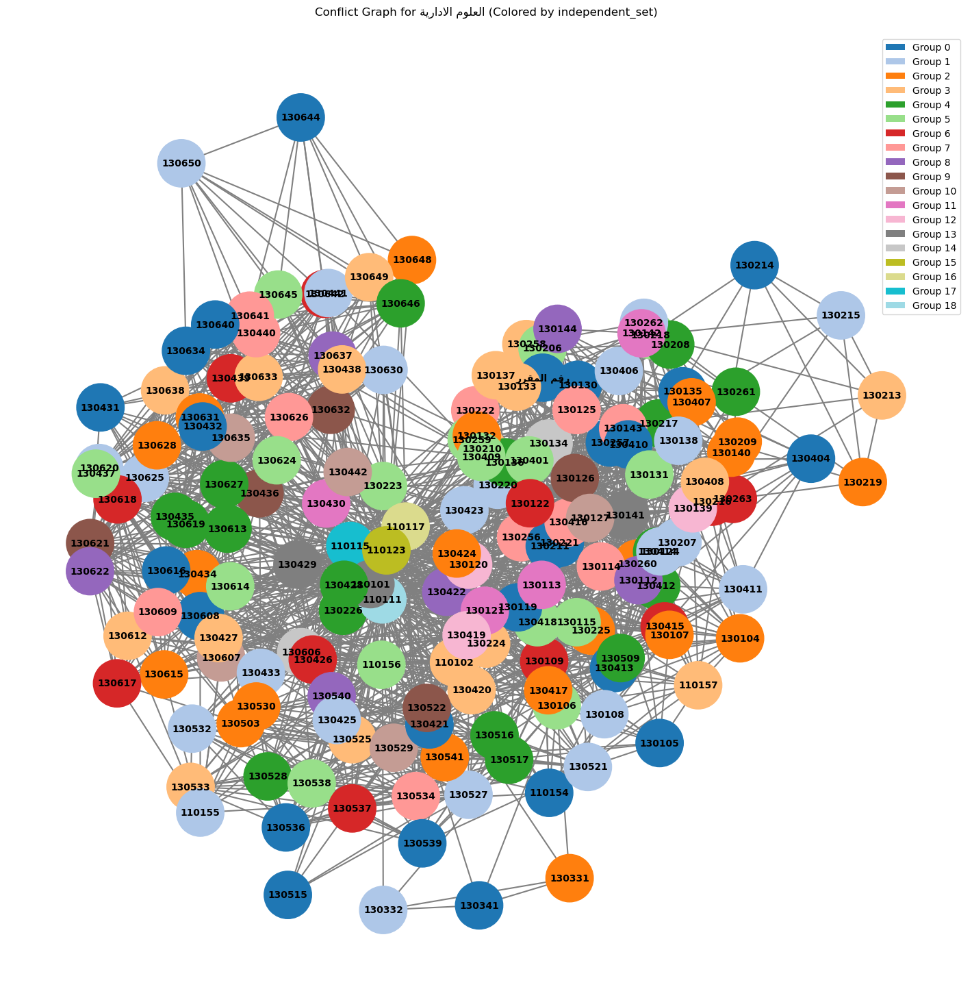

In [ ]:
        strategies = ['largest_first', 'smallest_last']
        for strategy in strategies:
            start = time()
            greedy_coloring_result = greedy_coloring(G, strategy)
            end = time()
            greedy_time = end - start

            greedy_timetable = defaultdict(list)
            total_students = 0
            total_conflicts = 0
            for course, period in greedy_coloring_result.items():
                student_count = len(course_students[course])
                course_name_ar = course_names_ar.get(course, "Unknown")
                greedy_timetable[period + 1].append((course, course_name_ar, student_count))  # Period starts from 1
                total_students += student_count
                total_conflicts += G.degree(course)  
                
            comparison_data.append({
                'Sheet': sheet_name,
                'Strategy': strategy,
                'Time Taken (seconds)': greedy_time,
                'Number of Periods Used': len(greedy_timetable),
                'Total Students Scheduled': total_students,
                'Number of Conflicts': total_conflicts
            })

            for period, courses in greedy_timetable.items():
                total_students_in_period = sum(sc for _, _, sc in courses)
                if total_students_in_period > MAX_STUDENTS_PER_DAY:
                    print(f"⚠ {strategy} Algorithm - Sheet: {sheet_name} - Period {period} exceeds max students per day ({total_students_in_period})")
                for course_code, course_name_ar, student_count in courses:
                    final_output.append({
                        'Sheet': sheet_name,
                        'Course Code': course_code,
                        'Course Name': course_name_ar,
                        'Student Count': student_count,
                        'Exam Period': period
                    })

            if len(G.nodes) > 0: 
                plt.figure(figsize=(14, 14))
                G_viz = G.copy()
                pos = nx.kamada_kawai_layout(G_viz)

                num_colors = max(greedy_coloring_result.values()) + 1
                cmap = cm.get_cmap('tab20', num_colors)

                node_colors = [mcolors.to_hex(cmap(greedy_coloring_result[node] % num_colors)) for node in G_viz.nodes()]

                labels = {node: fix_arabic(course_names_ar.get(node, "Unknown")) for node in G_viz.nodes()}

                nx.draw(G_viz, pos, labels=labels, with_labels=True, node_size=2500,
                        node_color=node_colors, font_size=10, font_weight='bold',
                        edge_color='gray', width=1.5)

                legend_elements = [Patch(facecolor=mcolors.to_hex(cmap(i % num_colors)), label=f'Group {i}') for i in range(num_colors)]
                plt.legend(handles=legend_elements, loc='best')
                plt.title(fix_arabic(f'Conflict Graph for {sheet_name} (Colored by {strategy})'), pad=20)
                plt.tight_layout()
                plt.show()

                course_student_counts = {course: len(students) for course, students in course_students.items()}
                plt.figure(figsize=(15, 10))
                plt.bar(course_student_counts.keys(), course_student_counts.values(), color='skyblue')
                plt.title(fix_arabic(f'Number of Students in Each Course for {sheet_name}'))
                plt.xlabel('Course')
                plt.ylabel('Number of Students')
                plt.xticks(rotation=90)
                plt.tight_layout()
                plt.show()

                course_degrees = dict(G.degree())
                plt.figure(figsize=(15, 10))
                plt.bar(course_degrees.keys(), course_degrees.values(), color='lightcoral')
                plt.title(fix_arabic(f'Degree of Each Course (Node) - Number of Conflicts for {sheet_name}'))
                plt.xlabel('Course')
                plt.ylabel('Degree (Number of Conflicts)')
                plt.xticks(rotation=90)
                plt.tight_layout()
                plt.show()

                group_degrees = {period: sum(course_degrees.get(course, 0) for course, _, _ in courses) for period, courses in greedy_timetable.items()}
                plt.figure(figsize=(15, 10))
                plt.bar(group_degrees.keys(), group_degrees.values(), color='lightseagreen')
                plt.title(fix_arabic(f'Degree of Each Group (Number of Conflicts per Period) for {sheet_name}'))
                plt.xlabel('Period')
                plt.ylabel('Degree (Total Conflicts in Period)')
                plt.xticks(rotation=90)
                plt.tight_layout()
                plt.show()

        processed_sheets.append(sheet_name)



main()

In [ ]:
    # Step 6: Export to Excel
    output_path = "exam_timetable_comparison_with_visualization.xlsx"
    with pd.ExcelWriter(output_path) as writer:
        pd.DataFrame(comparison_data).to_excel(writer, sheet_name='Comparison', index=False)
        pd.DataFrame(final_output).to_excel(writer, sheet_name='Timetable', index=False)

    # Step 7: Download the file
    files.download(output_path)
    print("\n✅ Comparison and Exam timetable exported and downloaded as: 'exam_timetable_comparison_with_visualization.xlsx'")

    # Summary of processed and skipped sheets
    print("⚠ Skipped Sheets:", skipped_sheets)